# COVID-19 Visualization & Prediction  

   Coronavirus Case Data is provided by <a href='https://github.com/CSSEGISandData/COVID-19'>Johns Hopkins University</a>
   
* <a href='#world_wide_graphs'>Exploring Global Coronavirus Cases</a>
* <a href='#country_graphs'>Exploring Coronavirus Cases From Different Countries</a>
* <a href='#prediction'>Worldwide Confirmed Cases Prediction</a>
* <a href='#data_table'>Data Table</a>
* <a href='#bar_charts'>Bar Charts</a>
* <a href='#hospital_testing'>US Testing Data</a>

In [13]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('seaborn-poster')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

In [30]:
df_confirm = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_death= pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_recovery = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
#df_latest = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/10-13-2021.csv')
#us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/10-13-2021.csv')

In [31]:
df_confirm.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,10/14/21,10/15/21,10/16/21,10/17/21,10/18/21,10/19/21,10/20/21,10/21/21,10/22/21,10/23/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,155682,155688,155739,155764,155776,155801,155859,155891,155931,155940
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,176667,177108,177536,177971,178188,178804,179463,180029,180623,181252
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,205005,205106,205199,205286,205364,205453,205529,205599,205683,205750
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,15326,15338,15338,15338,15367,15369,15382,15382,15404,15404
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,62385,62606,62789,62842,63012,63197,63340,63567,63691,63775


In [32]:

df_recovery.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,10/14/21,10/15/21,10/16/21,10/17/21,10/18/21,10/19/21,10/20/21,10/21/21,10/22/21,10/23/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
df_death.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,10/14/21,10/15/21,10/16/21,10/17/21,10/18/21,10/19/21,10/20/21,10/21/21,10/22/21,10/23/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,7238,7238,7238,7243,7246,7247,7247,7249,7252,7253
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2797,2807,2810,2820,2829,2841,2849,2855,2863,2870
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,5864,5867,5870,5872,5873,5875,5878,5881,5883,5886
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,130,130,130,130,130,130,130,130,130,130
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,1653,1660,1662,1664,1670,1678,1682,1685,1693,1695


In [34]:
#Drop useless column
df_confirm.drop(['Lat','Long'],axis=1, inplace=True)
df_death.drop(['Lat','Long'],axis=1, inplace=True)
df_recovery.drop(['Lat','Long'],axis=1, inplace=True)

In [35]:
df_confirm.head()

,Province/State,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,10/14/21,10/15/21,10/16/21,10/17/21,10/18/21,10/19/21,10/20/21,10/21/21,10/22/21,10/23/21
0,NaN,Afghanistan,0,0,0,0,0,0,0,0,...,155682,155688,155739,155764,155776,155801,155859,155891,155931,155940
1,NaN,Albania,0,0,0,0,0,0,0,0,...,176667,177108,177536,177971,178188,178804,179463,180029,180623,181252
2,NaN,Algeria,0,0,0,0,0,0,0,0,...,205005,205106,205199,205286,205364,205453,205529,205599,205683,205750
3,NaN,Andorra,0,0,0,0,0,0,0,0,...,15326,15338,15338,15338,15367,15369,15382,15382,15404,15404
4,NaN,Angola,0,0,0,0,0,0,0,0,...,62385,62606,62789,62842,63012,63197,63340,63567,63691,63775


In [36]:
cols = df_confirm.keys()
print(cols)

Index(['Province/State', 'Country/Region', '1/22/20', '1/23/20', '1/24/20',
       '1/25/20', '1/26/20', '1/27/20', '1/28/20', '1/29/20',
       ...
       '10/14/21', '10/15/21', '10/16/21', '10/17/21', '10/18/21', '10/19/21',
       '10/20/21', '10/21/21', '10/22/21', '10/23/21'],
      dtype='object', length=643)



Get all the dates for the ongoing coronavirus pandemic 

In [39]:
confirmed = df_confirm.loc[:, cols[2]:cols[-1]]
deaths = df_death.loc[:, cols[2]:cols[-1]]
recoveries = df_recovery.loc[:, cols[2]:cols[-1]]
print(confirmed.head())
print(deaths.head())
print(recoveries.head())

   1/22/20  1/23/20  1/24/20  1/25/20  1/26/20  1/27/20  1/28/20  1/29/20  \
0        0        0        0        0        0        0        0        0   
1        0        0        0        0        0        0        0        0   
2        0        0        0        0        0        0        0        0   
3        0        0        0        0        0        0        0        0   
4        0        0        0        0        0        0        0        0   

   1/30/20  1/31/20  ...  10/14/21  10/15/21  10/16/21  10/17/21  10/18/21  \
0        0        0  ...    155682    155688    155739    155764    155776   
1        0        0  ...    176667    177108    177536    177971    178188   
2        0        0  ...    205005    205106    205199    205286    205364   
3        0        0  ...     15326     15338     15338     15338     15367   
4        0        0  ...     62385     62606     62789     62842     63012   

   10/19/21  10/20/21  10/21/21  10/22/21  10/23/21  
0    155801   

In [41]:
dates = confirmed.keys()
world_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    recovered_sum = recoveries[i].sum()
    
    # confirmed, deaths, recovered, and active
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

Daily increases and moving averages

In [44]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)


# recoveries
world_daily_recovery = daily_increase(total_recovered)
world_recovery_avg = moving_average(total_recovered, window)
world_daily_recovery_avg = moving_average(world_daily_recovery, window)


#active 
world_active_avg = moving_average(total_active, window)

In [45]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

Future forcasting

In [47]:
days_in_future = 7
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-7]

Convert integer into datetime for better visualization

In [48]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

In [49]:
# Skipping the early days of the data to fit the model better (This is due to lack of sufficient of testing)
days_to_skip = 376
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[days_to_skip:], world_cases[days_to_skip:], test_size=0.08, shuffle=False) 

# Model for Predicting Confirmed Cases. 
 

## SVM

In [50]:
#  use this to find the optimal parameters for SVR
c = [0.01, 0.1, 1]
gamma = [0.01, 0.1, 1]
epsilon = [0.01, 0.1, 1]
shrinking = [True, False]

svm_grid = {'C': c, 'gamma' : gamma, 'epsilon': epsilon, 'shrinking' : shrinking}

svm = SVR(kernel='poly', degree=3)
svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=30, verbose=1)
svm_search.fit(X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


KeyboardInterrupt: 

In [15]:
svm_search.best_params_

In [51]:

svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)

MAE: 15280277.708799345
MSE: 241974372879460.62


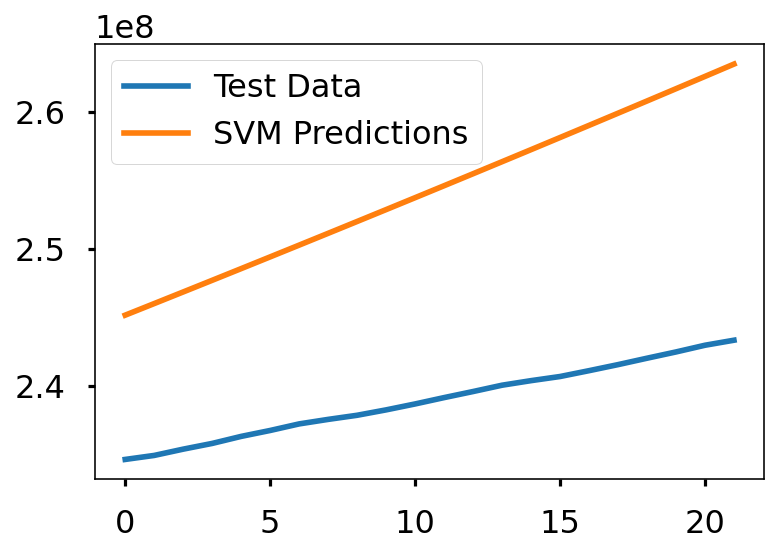

In [52]:
# check against testing data
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

In [53]:
# transform our data for polynomial regression
poly = PolynomialFeatures(degree=2)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=2)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [54]:
# polynomial regression
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 1165937.803512255
MSE: 1924927402916.5781


In [55]:
print(linear_model.coef_)

[[-1.26887364e+08  6.31428498e+05 -7.69161193e+01]]


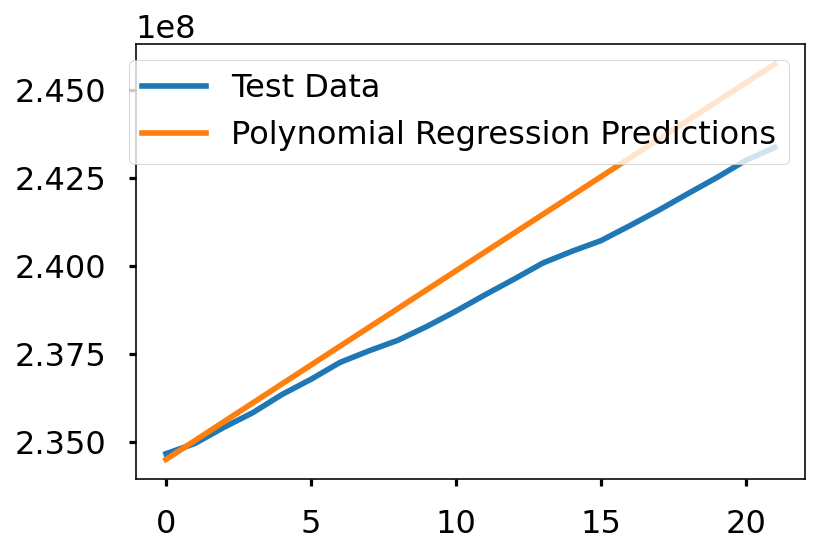

In [56]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

In [22]:
# bayesian ridge polynomial regression
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
normalize = [True, False]

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2' : alpha_2, 'lambda_1': lambda_1, 'lambda_2' : lambda_2, 
                 'normalize' : normalize}

bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=40, verbose=1)
bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    2.3s finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=BayesianRidge(alpha_1=1e-06, alpha_2=1e-06,
                                           compute_score=False, copy_X=True,
                                           fit_intercept=False, lambda_1=1e-06,
                                           lambda_2=1e-06, n_iter=300,
                                           normalize=False, tol=0.001,
                                           verbose=False),
                   iid='warn', n_iter=40, n_jobs=-1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                 

In [23]:
bayesian_search.best_params_

{'tol': 1e-06,
 'normalize': False,
 'lambda_2': 1e-06,
 'lambda_1': 1e-07,
 'alpha_2': 1e-05,
 'alpha_1': 0.001}

In [24]:
bayesian_confirmed = bayesian_search.best_estimator_
test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forcast)
print('MAE:', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_bayesian_pred, y_test_confirmed))

MAE: 4244265.704572995
MSE: 19213382372064.168


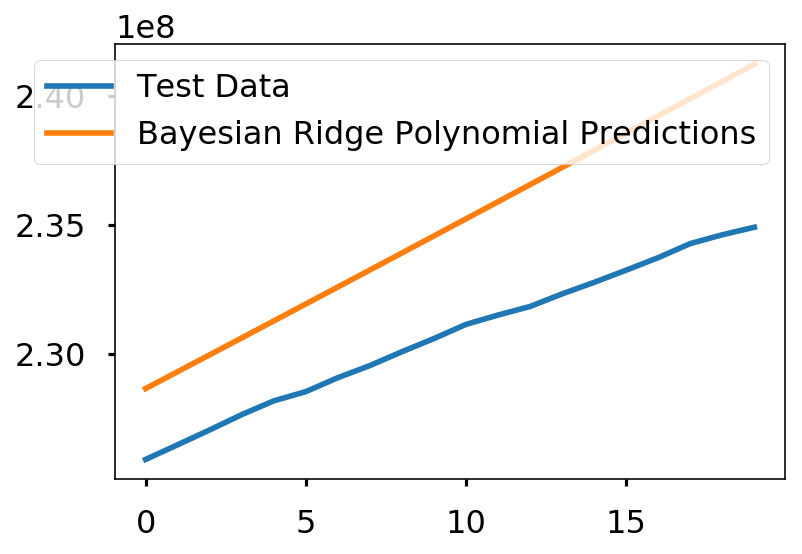

In [25]:
plt.plot(y_test_confirmed)
plt.plot(test_bayesian_pred)
plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])

# Worldwide Overview 
Visualizing the number of confirmed cases, deaths, and mortality rate (CFR).
 <a id='world_wide_graphs'></a>

In [57]:
# helper method for flattening the data, so it can be displayed on a bar graph 
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a

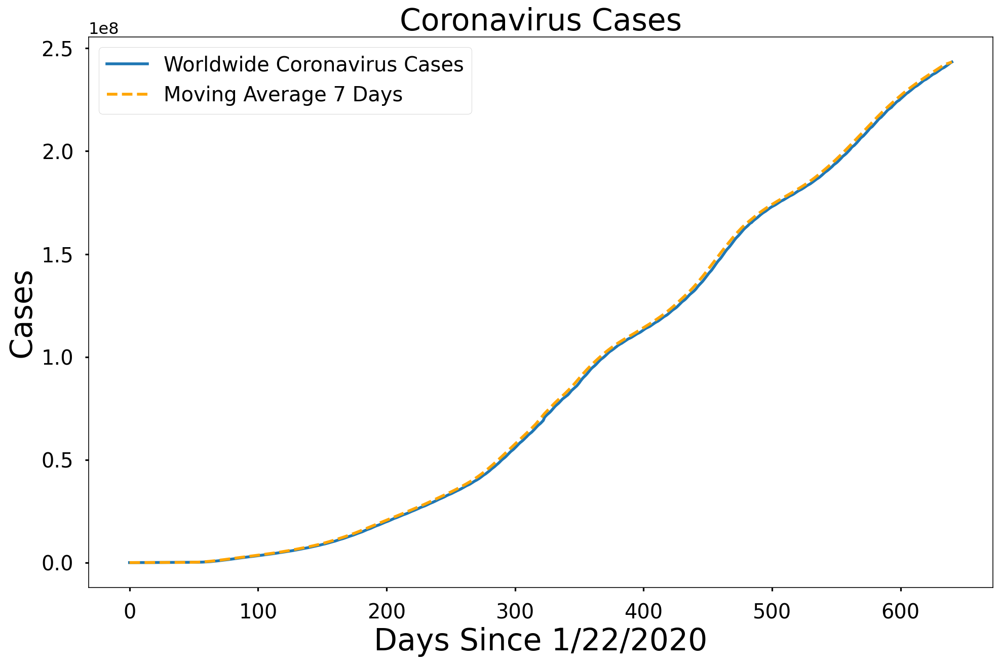

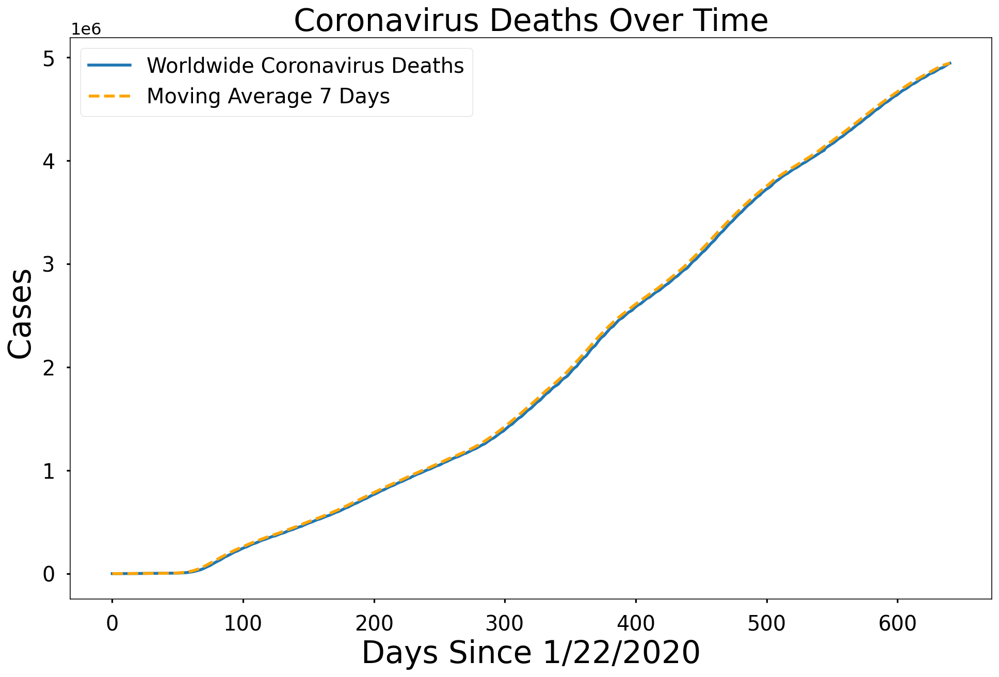

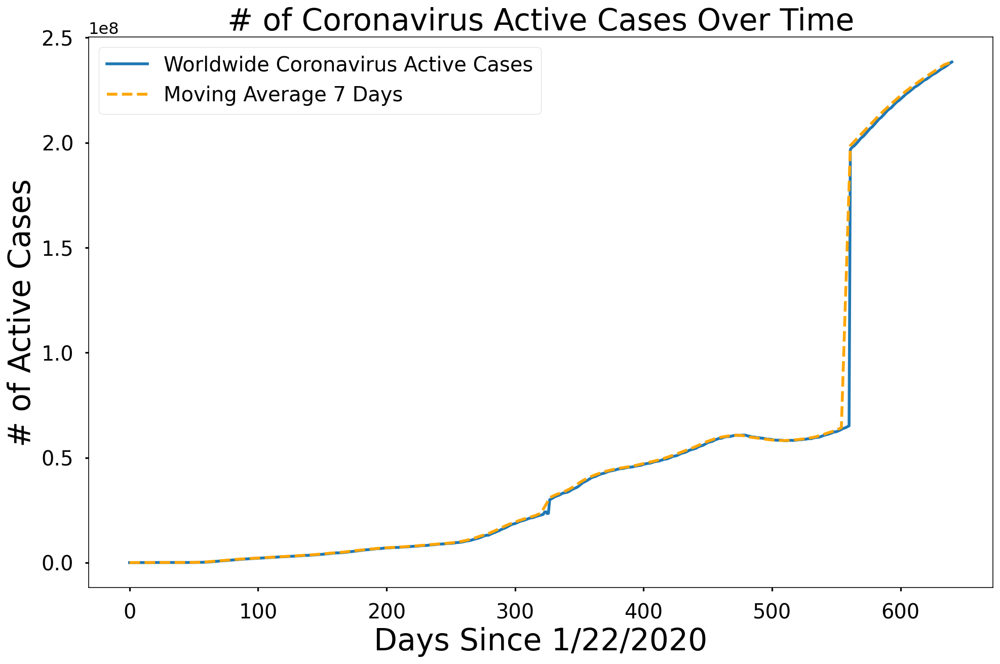

In [76]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('Coronavirus Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel(' Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_active)
plt.plot(adjusted_dates, world_active_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Active Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Active Cases', size=30)
plt.legend(['Worldwide Coronavirus Active Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

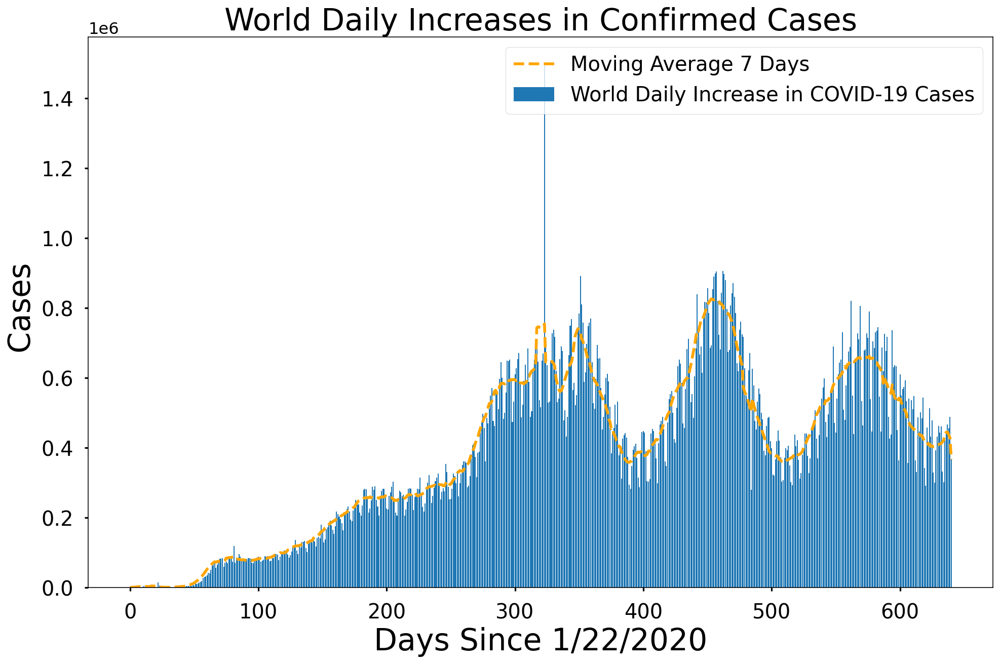

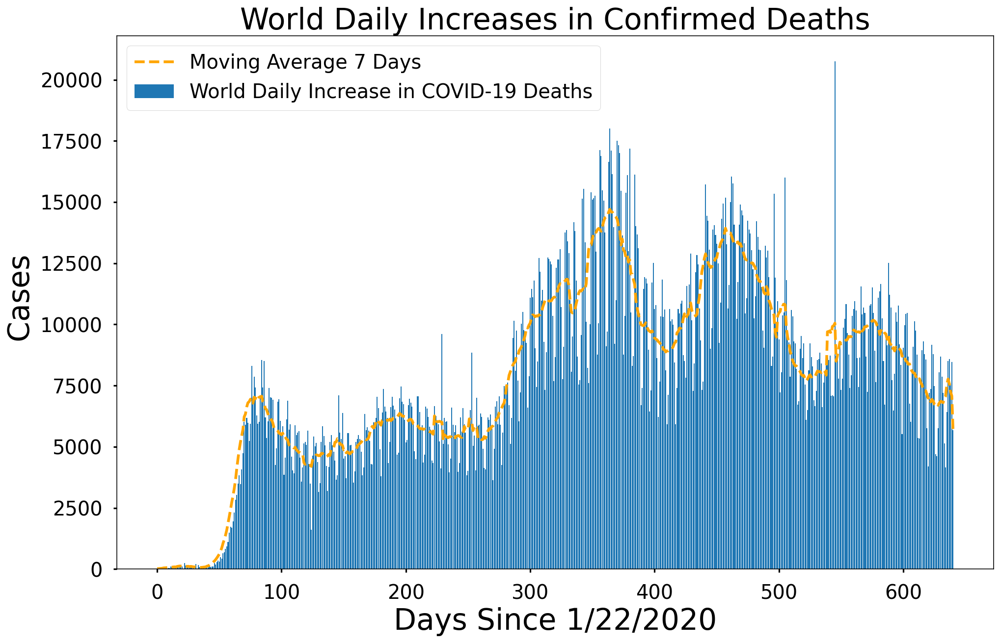

In [59]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel(' Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel(' Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

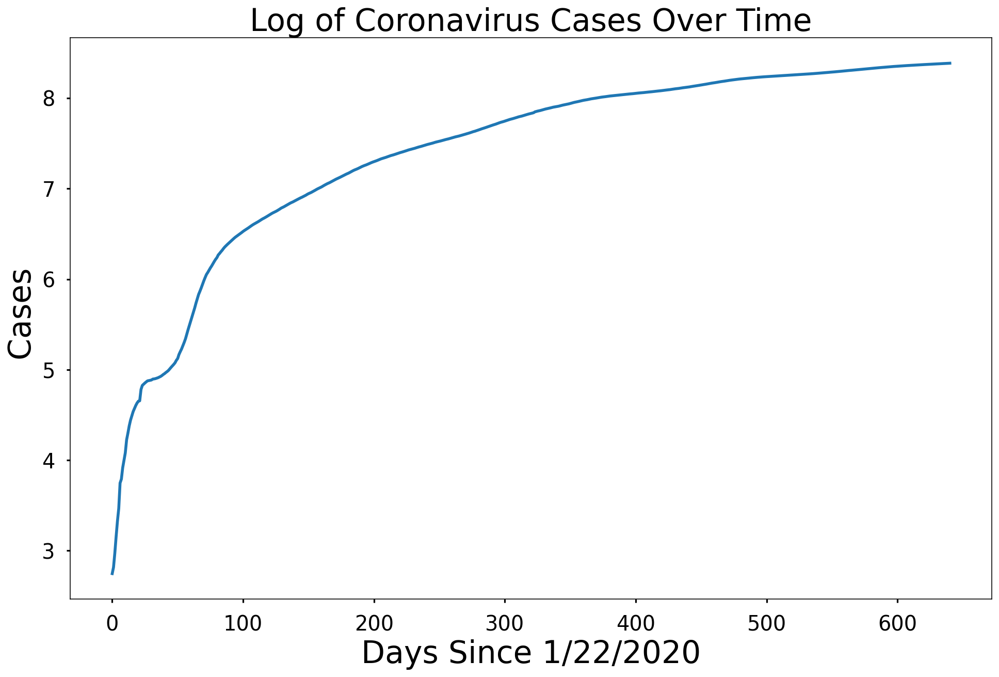

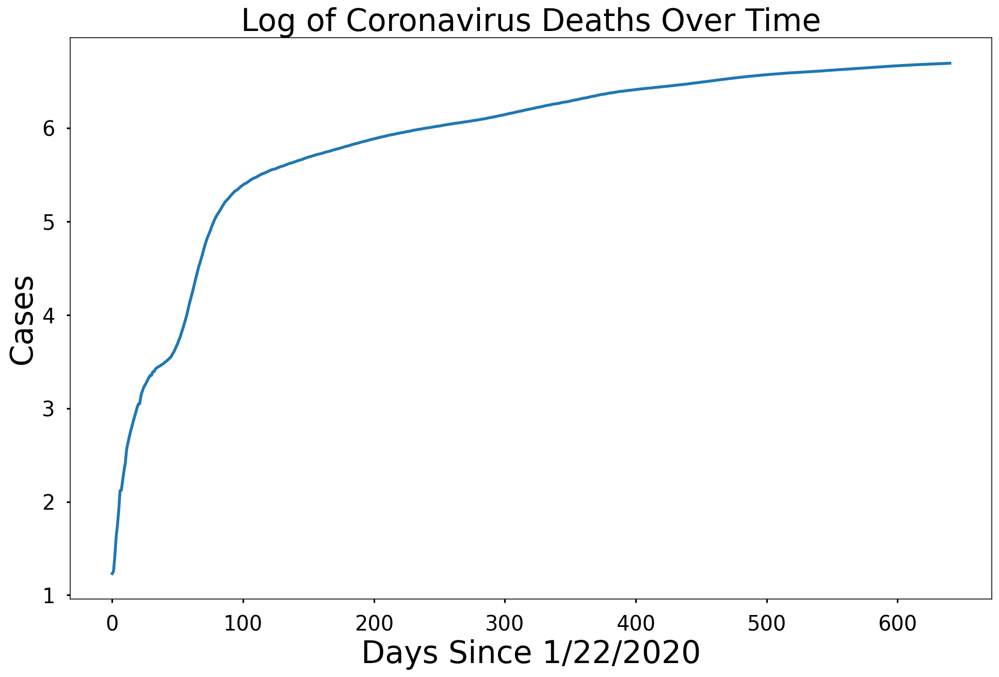

In [60]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel(' Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()



In [78]:
def country_plot(x, y1, y2, y3, y4, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    recovery_increase_avg = moving_average(y4, window)
    
    plt.figure(figsize=(16, 10))
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

      
# helper function for getting country's cases, deaths, and recoveries        
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    country_recoveries = []  
    
    for i in dates:
        country_cases.append(df_confirm[df_confirm['Country/Region']==country_name][i].sum())
        country_deaths.append(df_death[df_death['Country/Region']==country_name][i].sum())
        country_recoveries.append(df_recovery[df_recovery['Country/Region']==country_name][i].sum())
    return (country_cases, country_deaths,country_recoveries)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    country_recoveries= country_info[2]
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    country_daily_recovery = daily_increase(country_recoveries)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_daily_recovery, country_name)
    

# Country Specific Graphs
Unlike the previous section, we are taking a look at specific countries. This allows us to examine the pandemic at a local level. 
<a id='country_graphs'></a>

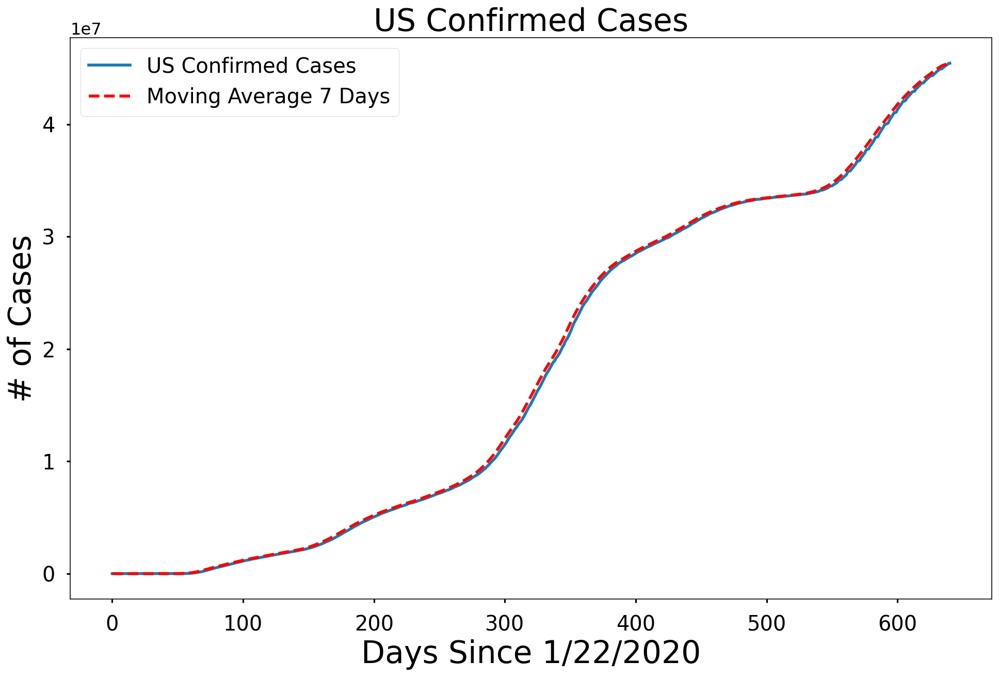

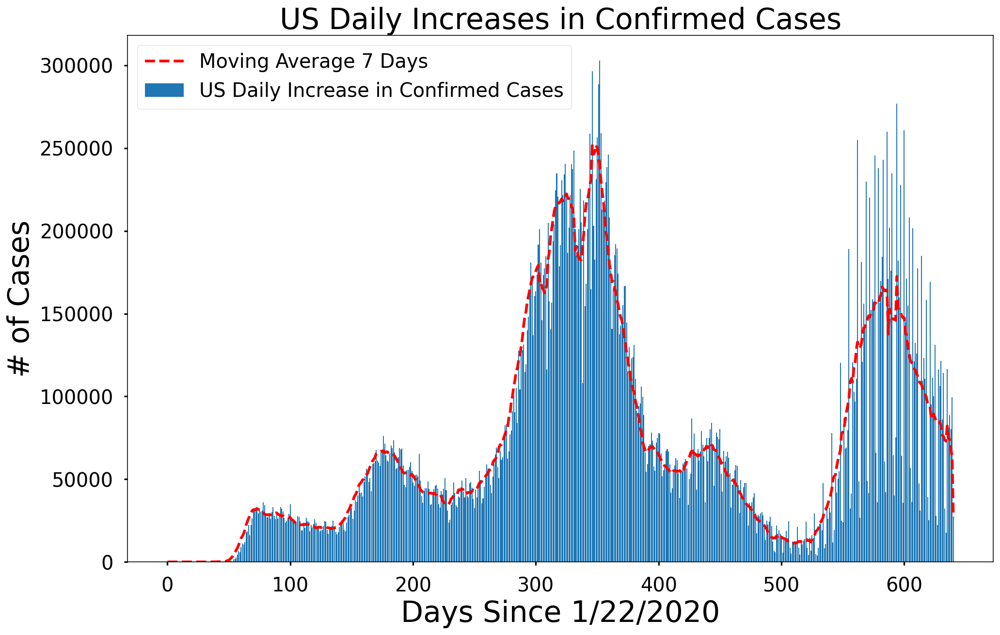

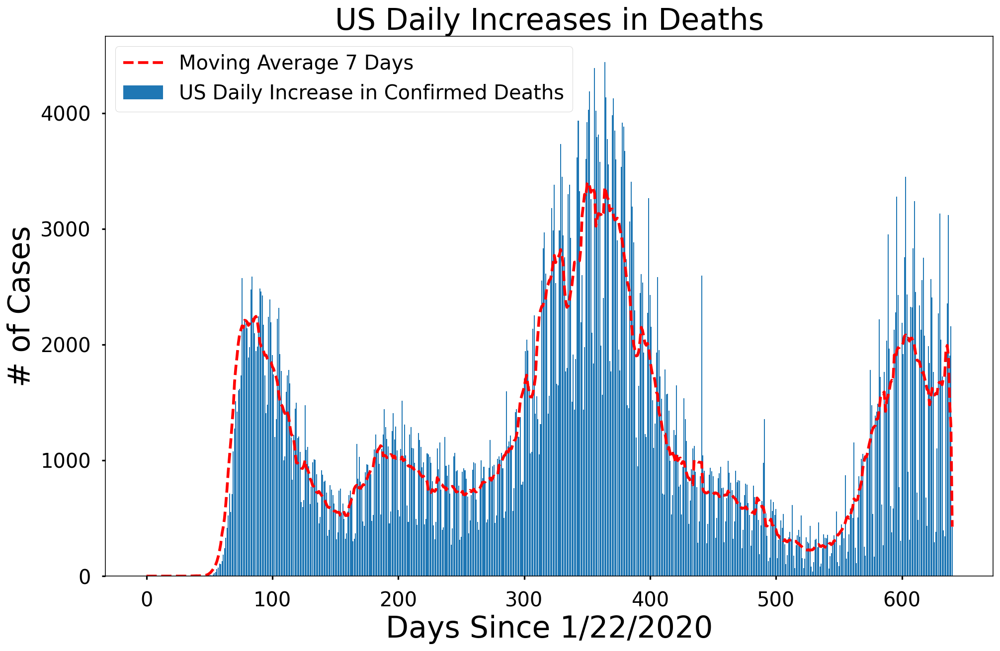

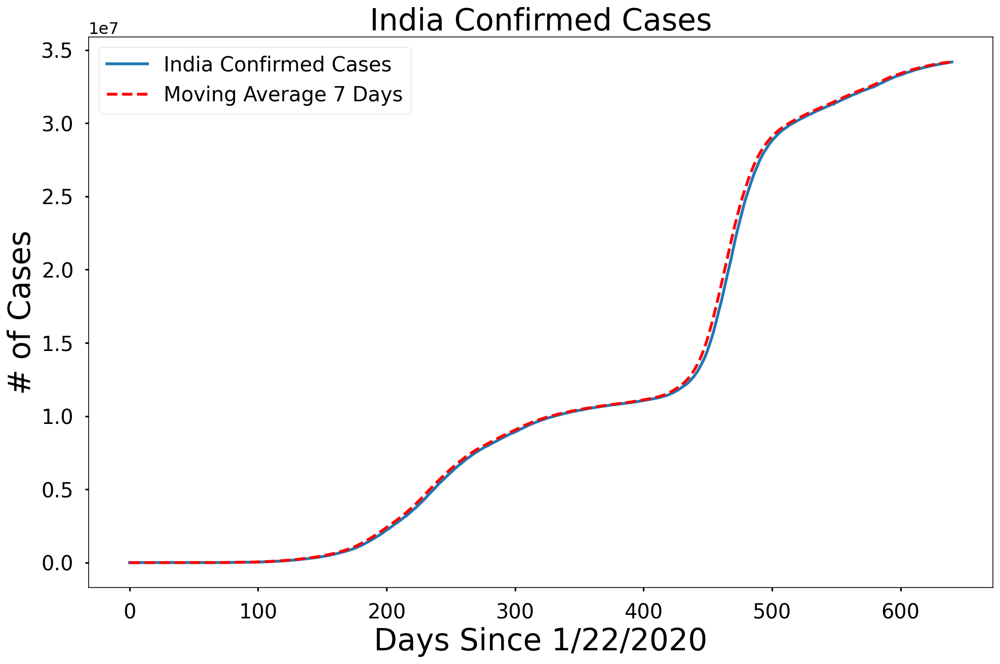

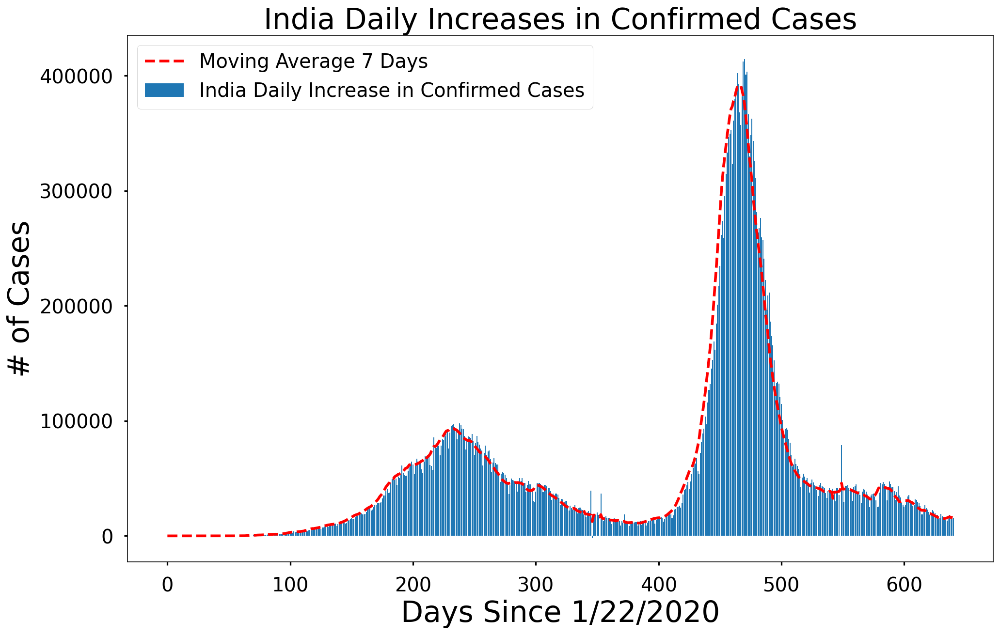

...

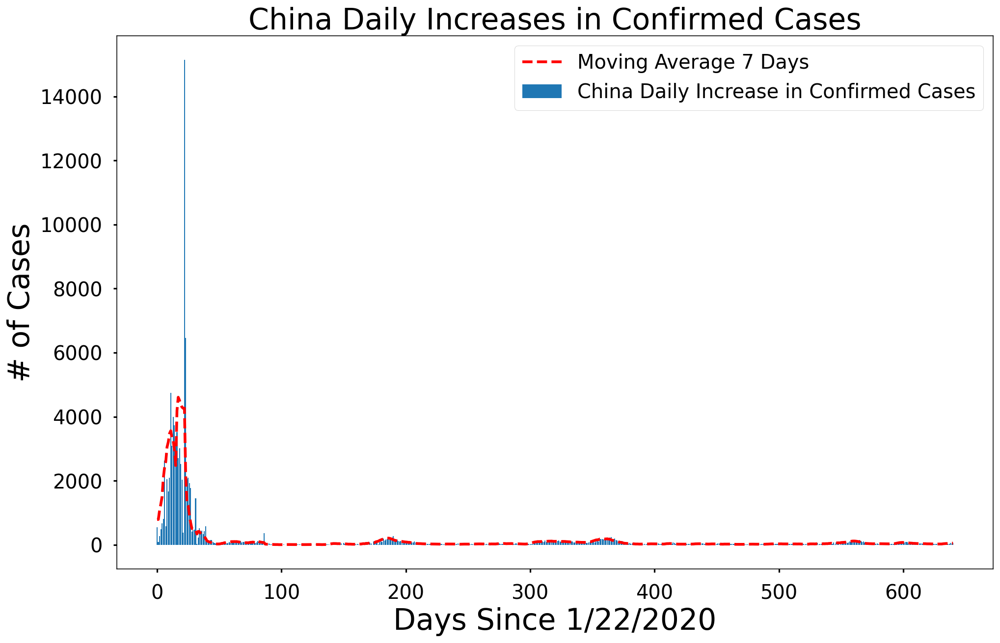

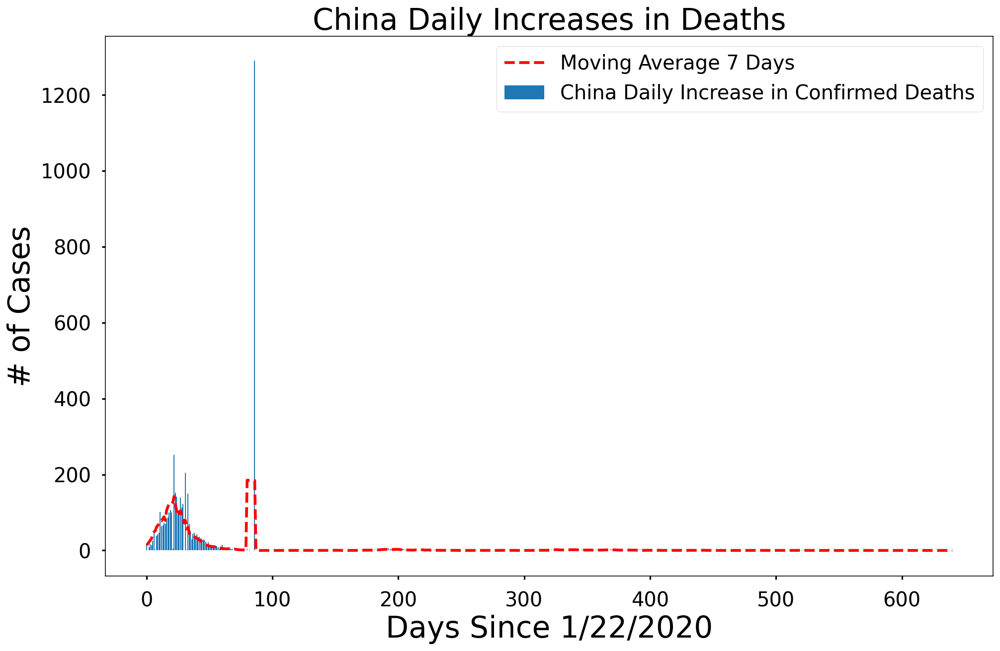

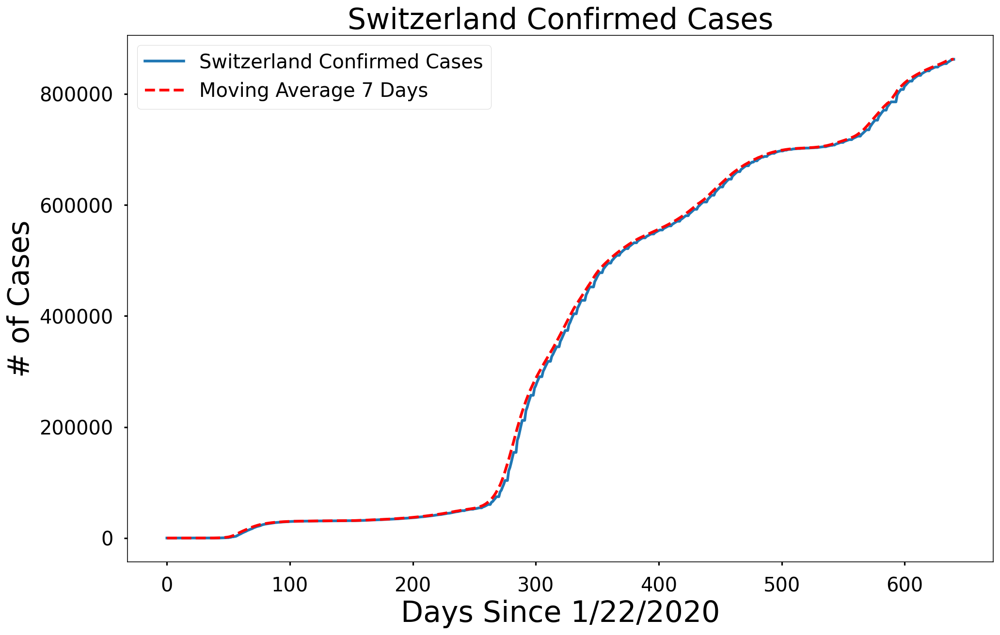

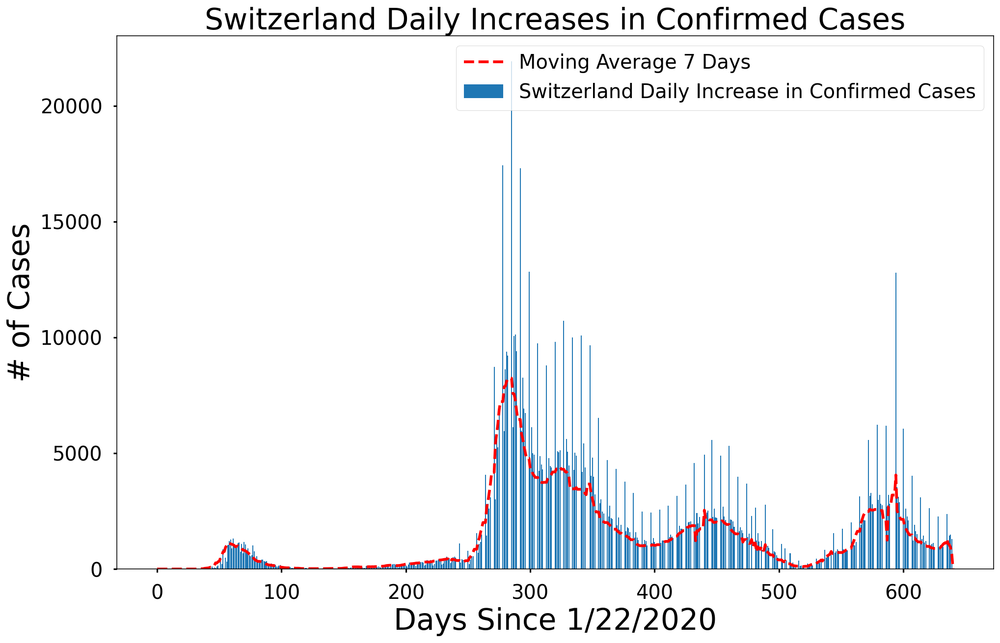

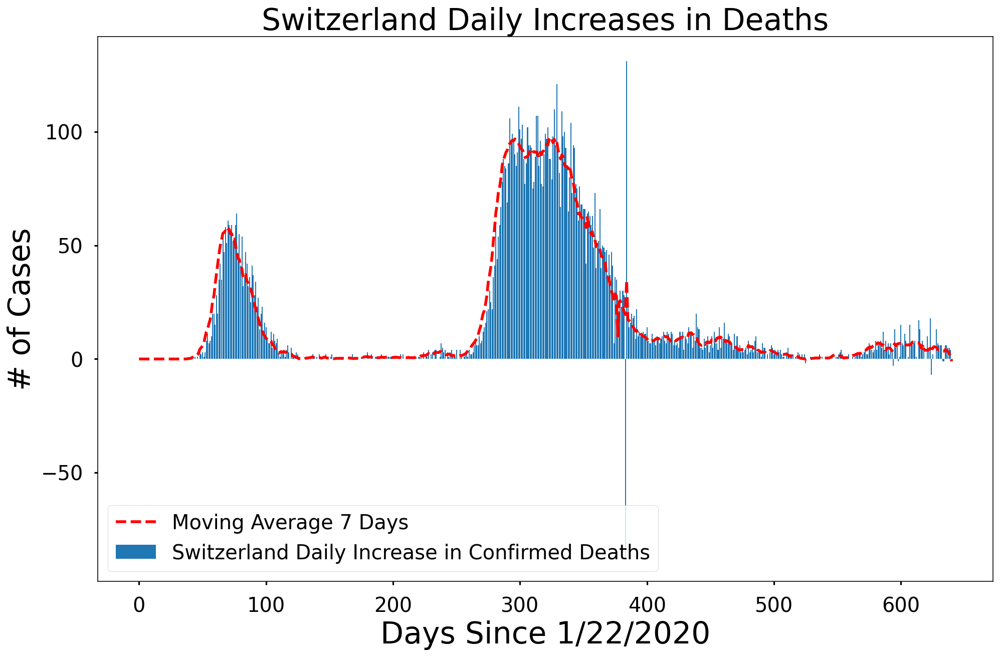

In [79]:
countries = ['US', 'India', 'China','Switzerland'] 
eu_countries=['Italy',
             'Germany', 'Spain', 'France', 'United Kingdom',  'Netherlands', 'Belgium', 'Poland', 'Czechia', 'Switzerland',
            'Romania','Portugal', 'Austria', 'Sweden']
for country in countries:
    country_visualizations(country)

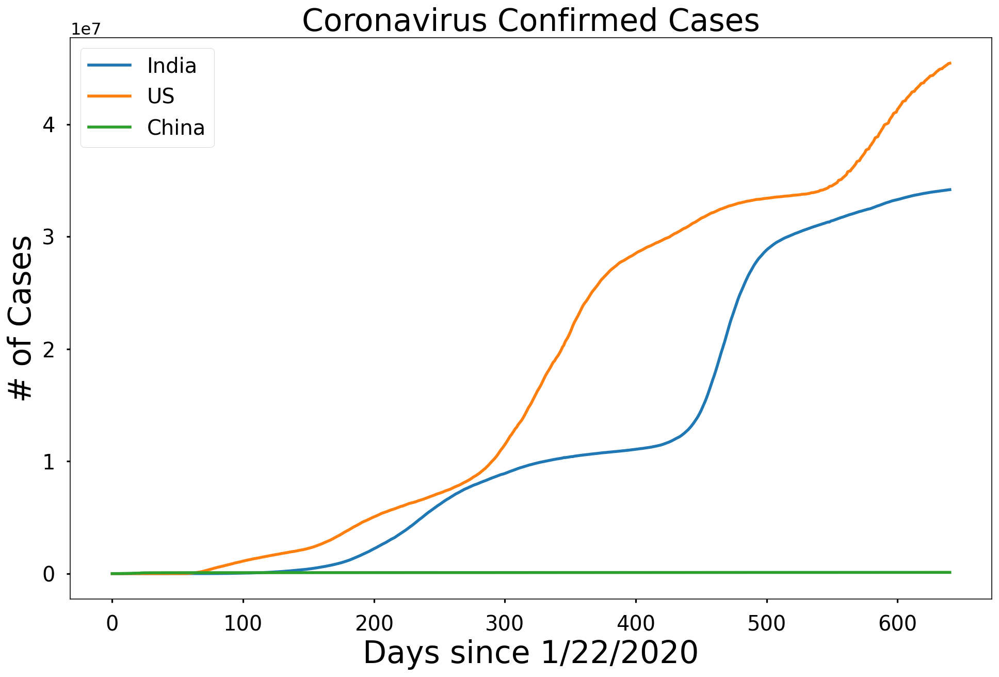

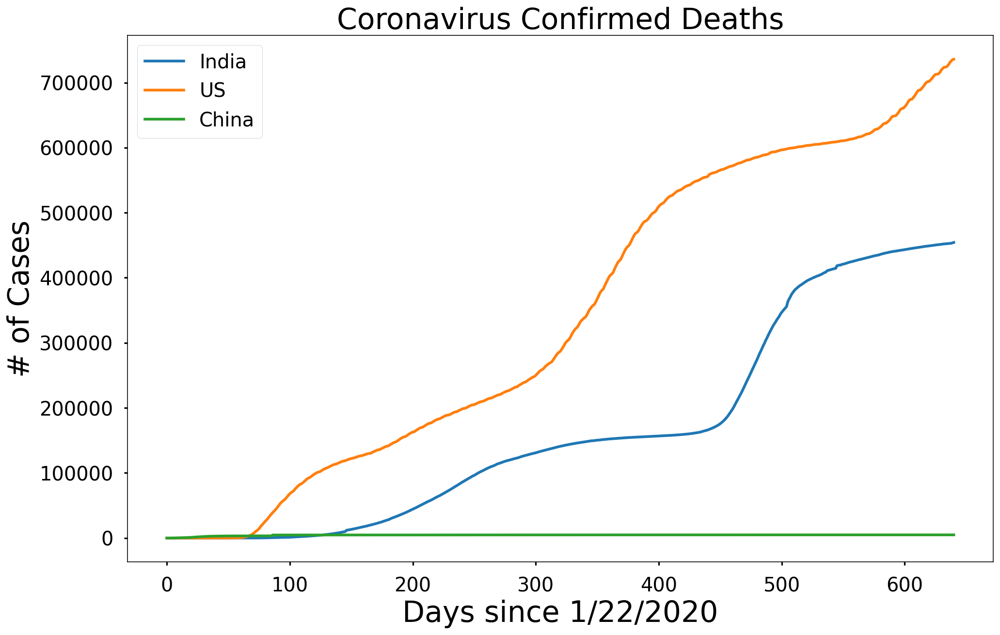

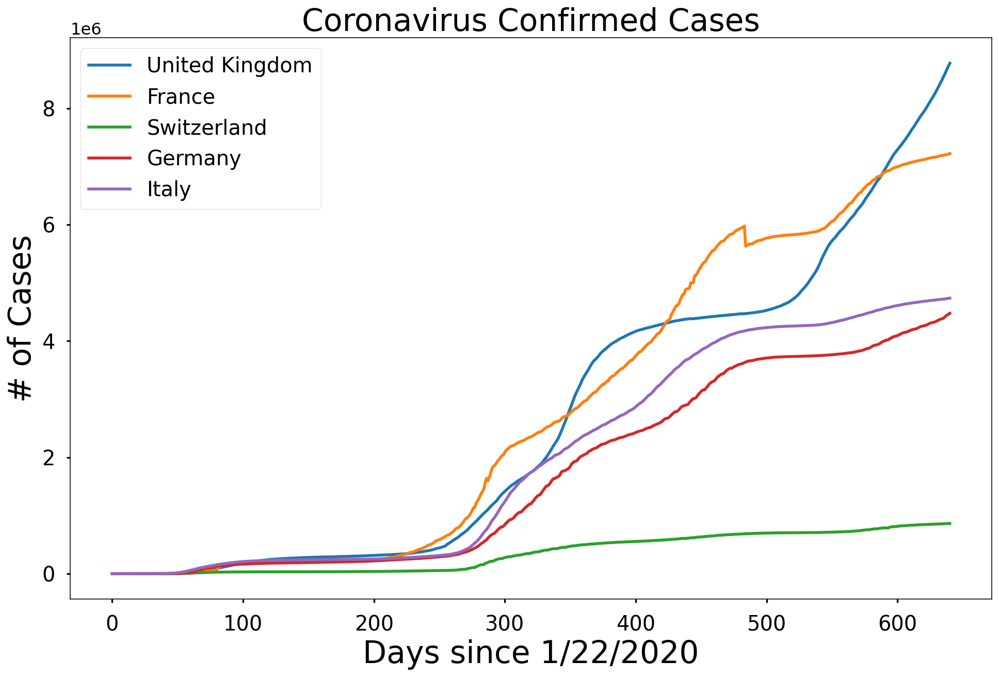

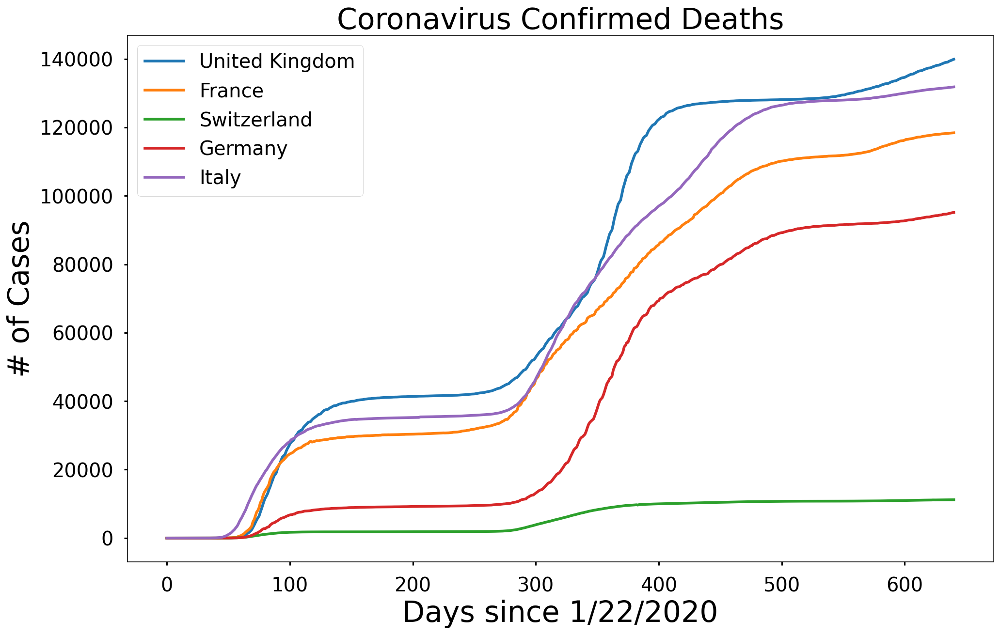

In [84]:


compare_countries = ['India', 'US', 'China', ] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths']
eu_compare=['United Kingdom', 'France','Switzerland','Germany','Italy']
for num in range(2):
    plt.figure(figsize=(16, 10))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

for num in range(2):
    plt.figure(figsize=(16, 10))
    for country in eu_compare:
        plt.plot(get_country_info(country)[num])
    plt.legend(eu_compare, prop={'size': 20})
    plt.xlabel('Days since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

In [85]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 10))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

# Predictions for confirmed coronavirus cases worldwide
These three models predict future covid cases on a global level. 

The prediction models include 
* Support Vector Machine 
* Polynomial Regression 
* Bayesian Ridge Regression 

<a id='prediction'></a>

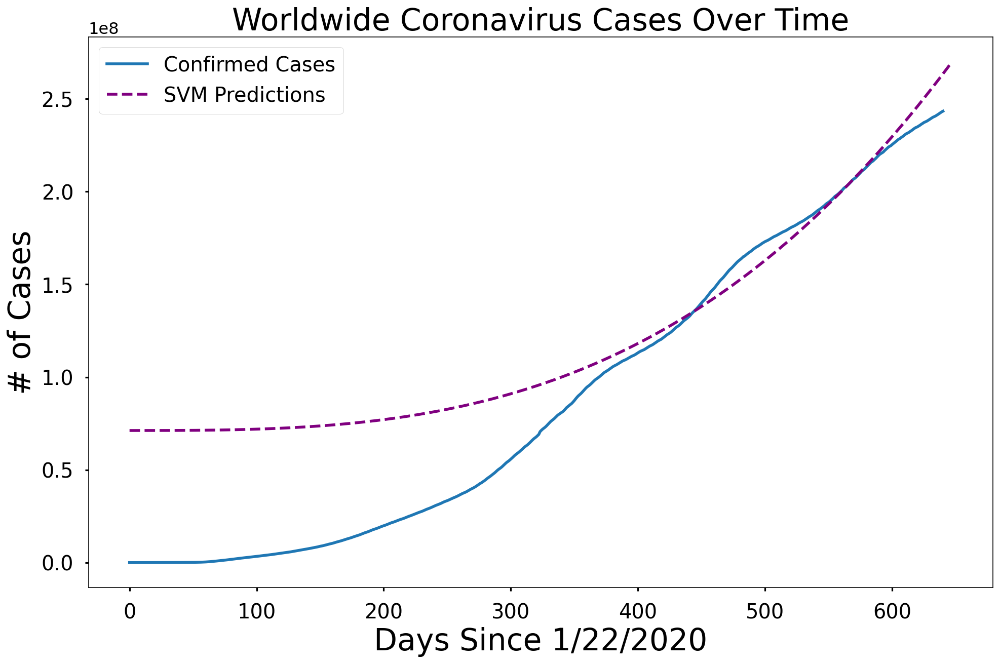

In [86]:
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM Predictions', 'purple')

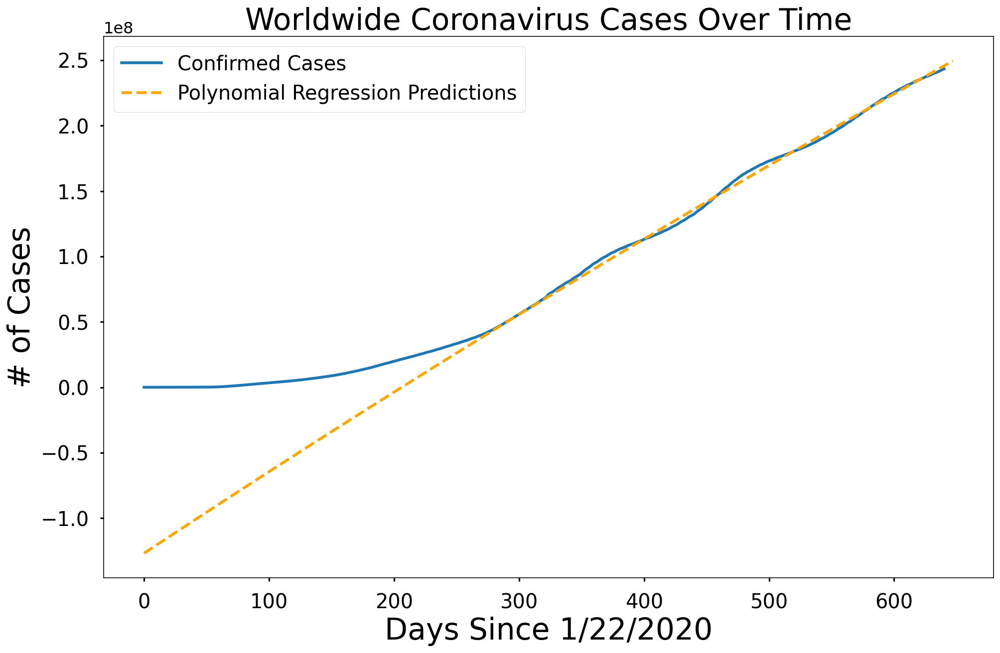

In [87]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'orange')

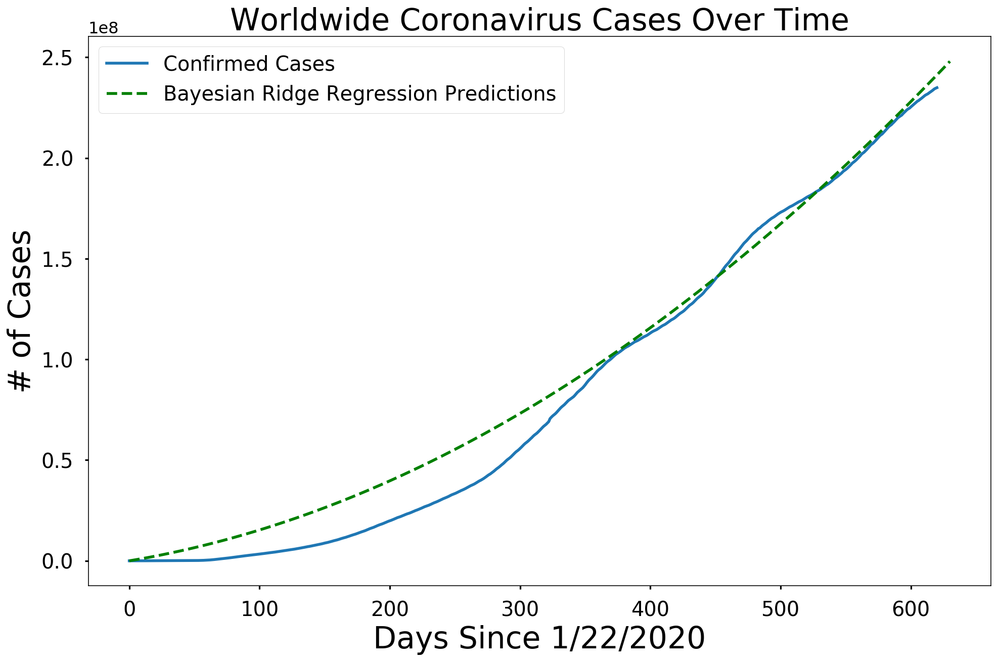

In [36]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian Ridge Regression Predictions', 'green')

In [88]:
# Future predictions using SVM 
svm_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,10/21/2021,261700141.000000
1,10/22/2021,262597263.000000
2,10/23/2021,263497197.000000
3,10/24/2021,264399948.000000
4,10/25/2021,265305521.000000
5,10/26/2021,266213918.000000
6,10/27/2021,267125146.000000
7,10/28/2021,268039208.000000
8,10/29/2021,268956108.000000
9,10/30/2021,269875852.000000


In [89]:
# Future predictions using polynomial regression
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')

,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,10/21/2021,244655773.000000
1,10/22/2021,245188980.000000
2,10/23/2021,245722032.000000
3,10/24/2021,246254931.000000
4,10/25/2021,246787676.000000
5,10/26/2021,247320268.000000
6,10/27/2021,247852705.000000
7,10/28/2021,248384989.000000
8,10/29/2021,248917119.000000
9,10/30/2021,249449095.000000


In [90]:
# Future predictions using Bayesian Ridge 
bayesian_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')

NameError: name 'bayesian_pred' is not defined

## Worldwide Mortality Rate 

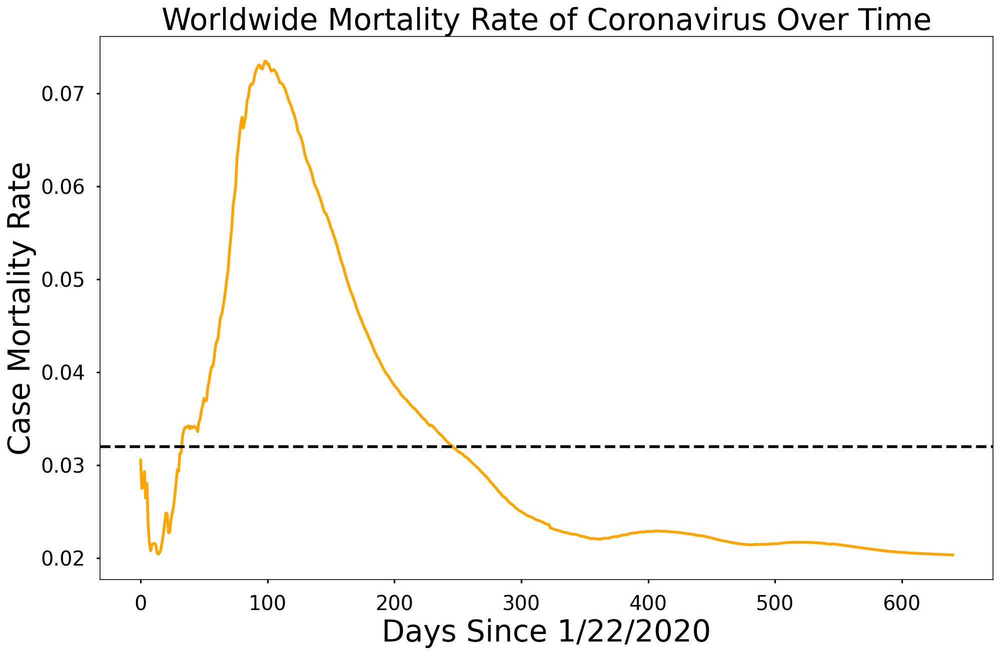

In [92]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

## Worldwide Recovery Rate 

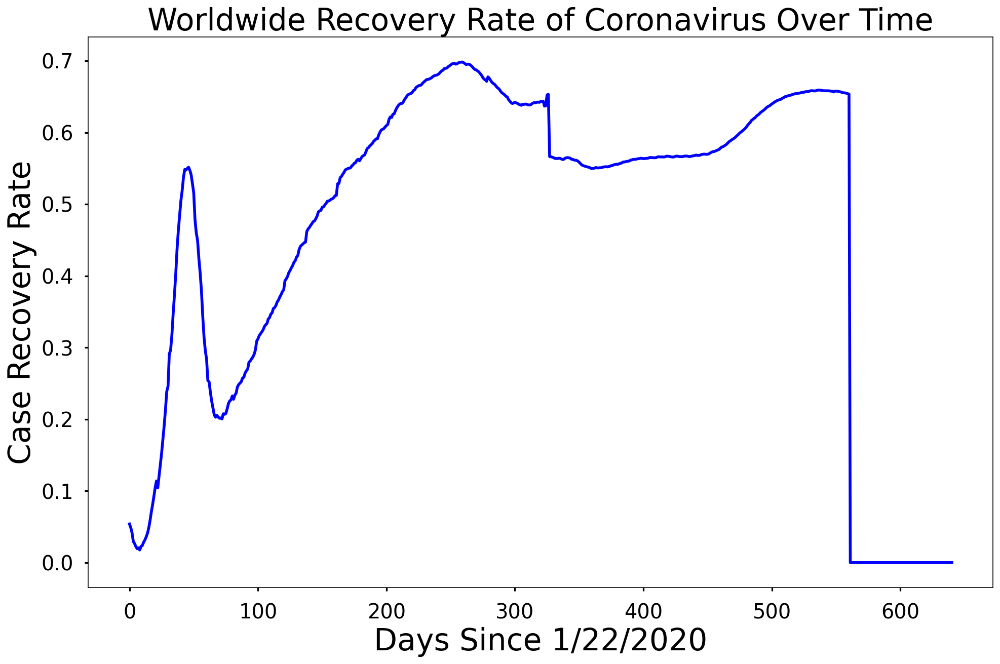

In [93]:
mean_recovery_rate = np.mean(recovery_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, recovery_rate, color='blue')
plt.title('Worldwide Recovery Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Recovery Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Graphing deaths against recoveries

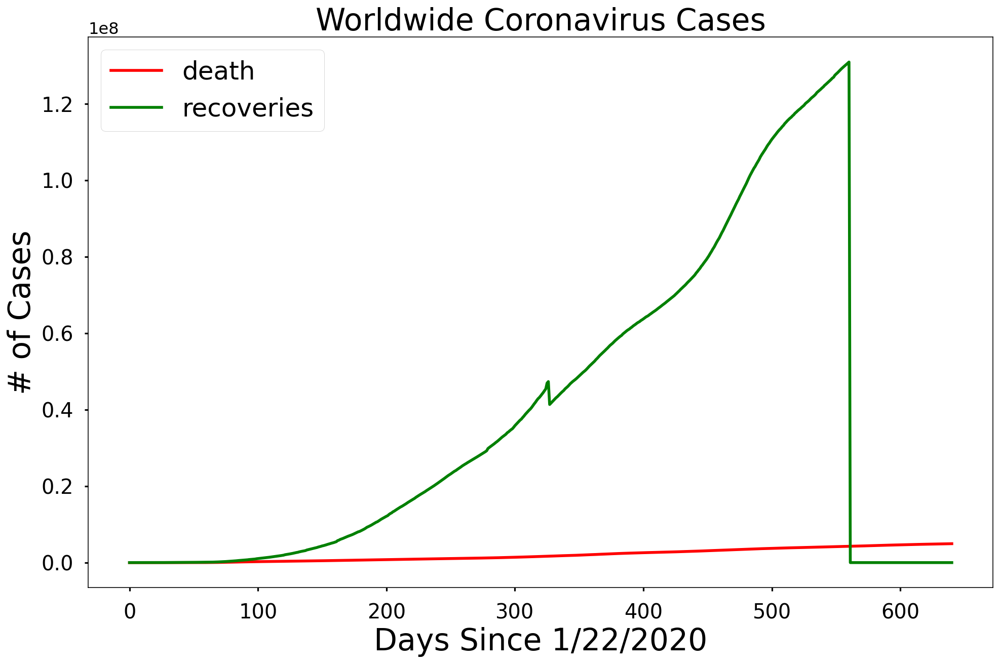

In [94]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, total_deaths, color='r')
plt.plot(adjusted_dates, total_recovered, color='green')
plt.legend(['death', 'recoveries'], loc='best', fontsize=25)
plt.title('Worldwide Coronavirus Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Getting information about **countries/regions** that have confirmed coronavirus cases

In [44]:
latest_data

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-10-04 04:21:31,33.939110,67.709953,155191,7206,NaN,NaN,Afghanistan,398.658140,4.643311
1,NaN,NaN,NaN,Albania,2021-10-04 04:21:31,41.153300,20.168300,171794,2713,NaN,NaN,Albania,5969.629578,1.579217
2,NaN,NaN,NaN,Algeria,2021-10-04 04:21:31,28.033900,1.659600,203789,5822,NaN,NaN,Algeria,464.730109,2.856876
3,NaN,NaN,NaN,Andorra,2021-10-04 04:21:31,42.506300,1.521800,15222,130,NaN,NaN,Andorra,19701.028926,0.854027
4,NaN,NaN,NaN,Angola,2021-10-04 04:21:31,-11.202700,17.873900,58943,1577,NaN,NaN,Angola,179.341932,2.675466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3999,NaN,NaN,NaN,Vietnam,2021-10-04 04:21:31,14.058324,108.277199,808578,19715,NaN,NaN,Vietnam,830.686019,2.438231
4000,NaN,NaN,NaN,West Bank and Gaza,2021-10-04 04:21:31,31.952200,35.233200,406652,4144,NaN,NaN,West Bank and Gaza,7971.355404,1.019053
4001,NaN,NaN,NaN,Yemen,2021-10-04 04:21:31,15.552727,48.516388,9139,1734,NaN,NaN,Yemen,30.641084,18.973629
4002,NaN,NaN,NaN,Zambia,2021-10-04 04:21:31,-13.133897,27.849332,209163,3649,NaN,NaN,Zambia,1137.747501,1.744572


In [98]:
unique_countries =  list(df_confirm['Country/Region'].unique())

In [99]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
# country_recovery_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

NameError: name 'latest_data' is not defined

# Data table
<a id='data_table'></a>
This shows covid data for several countries. The table includes the number of confirmed cases, deaths, incidence rate, and mortality rate. 

In [100]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': [format(int(i), ',d') for i in country_confirmed_cases],
                          'Number of Deaths': [format(int(i), ',d') for i in country_death_cases], 
                          'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Oranges')

ValueError: arrays must all be same length

In [48]:
unique_provinces =  list(latest_data['Province_State'].unique())

Getting the latest information about **provinces/states** that have confirmed coronavirus cases

In [49]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
# province_recovery_cases = []
# province_active = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
#     province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [51]:
# number of cases per province/state/city top 100 
province_limit = 100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': [format(int(i), ',d') for i in province_confirmed_cases[:province_limit]],
                          'Number of Deaths': [format(int(i), ',d') for i in province_death_cases[:province_limit]], 
                        'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,United Kingdom,"6,725,105","119,813",12014,0.0178158
1,Maharashtra,India,"6,559,349","139,207",5326.56,0.0212227
2,California,US,"4,732,419","69,256",641833,0.0146344
3,Kerala,India,"4,720,206","25,377",13222.1,0.00537625
4,Sao Paulo,Brazil,"4,369,538","150,064",9515.74,0.0343432
5,Texas,US,"4,084,361","65,914",3.69529e+06,0.0161381
6,Florida,US,"3,620,106","55,299",1.13265e+06,0.0152755
7,Karnataka,India,"2,977,889","37,819",4407.59,0.0126999
8,Tamil Nadu,India,"2,668,495","35,650",3428.12,0.0133596
9,New York,US,"2,439,639","55,457",627050,0.0227316


In [52]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
#     state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
#         state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': [format(int(i), ',d') for i in state_confirmed_cases],
                              'Number of Deaths': [format(int(i), ',d') for i in state_death_cases], 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})
    # number of cases per country/region
    return state_df

Data table for **India**

In [53]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Maharashtra,"6,559,349","139,207",5326.56,0.0212227
1,Kerala,"4,720,206","25,377",13222.1,0.00537625
2,Karnataka,"2,977,889","37,819",4407.59,0.0126999
3,Tamil Nadu,"2,668,495","35,650",3428.12,0.0133596
4,Andhra Pradesh,"2,052,763","14,204",3808.23,0.00691945
5,Uttar Pradesh,"1,709,857","22,894",718.781,0.0133894
6,West Bengal,"1,571,240","18,825",1577.4,0.011981
7,Delhi,"1,438,966","25,088",7690.51,0.0174347
8,Punjab,"1,035,008","29,205",2390.18,0.0282172
9,Odisha,"1,027,959","8,214",2217.52,0.00799059


Data table for the **United States**

In [54]:
us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,California,"4,732,419","69,256",641833,0.0146344
1,Texas,"4,084,361","65,914",3.69529e+06,0.0161381
2,Florida,"3,620,106","55,299",1.13265e+06,0.0152755
3,New York,"2,439,639","55,457",627050,0.0227316
4,Illinois,"1,630,864","27,450",1.53942e+06,0.0168316
5,Georgia,"1,582,063","26,242",2.45887e+06,0.0165872
6,Pennsylvania,"1,444,053","29,515",777886,0.020439
7,Ohio,"1,429,745","22,273",1.11792e+06,0.0155783
8,North Carolina,"1,400,217","16,605",1.36827e+06,0.0118589
9,Tennessee,"1,231,820","15,198",1.78535e+06,0.0123378


Data table for **Brazil**

In [55]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Sao Paulo,"4,369,538","150,064",9515.74,0.0343432
1,Minas Gerais,"2,147,088","54,719",10142.7,0.0254852
2,Parana,"1,516,637","39,208",13264.3,0.0258519
3,Rio Grande do Sul,"1,440,854","34,911",12664.4,0.0242294
4,Rio de Janeiro,"1,289,808","66,437",7470.68,0.0515092
5,Bahia,"1,235,139","26,873",8304.54,0.0217571
6,Santa Catarina,"1,194,687","19,313",16674.4,0.0161657
7,Ceara,"940,929","24,246",10303.6,0.0257682
8,Goias,"867,015","23,566",12353.5,0.0271806
9,Pernambuco,"621,834","19,764",6506.53,0.0317834


Data table for **Russia**

In [56]:
russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Moscow,"1,646,239","29,176",13163.1,0.0177228
1,Saint Petersburg,"627,955","22,027",11733.2,0.0350774
2,Moscow Oblast,"453,625","8,226",6045.6,0.0181339
3,Nizhny Novgorod Oblast,"171,404","6,704",5298.83,0.0391123
4,Sverdlovsk Oblast,"140,536","6,418",3249.19,0.045668
5,Rostov Oblast,"140,133","6,891",3320.33,0.0491747
6,Voronezh Oblast,"135,078","4,469",5787.98,0.0330846
7,Krasnoyarsk Krai,"117,146","5,889",4072.52,0.0502706
8,Irkutsk Oblast,"110,196","4,854",4583.49,0.0440488
9,Samara Oblast,"107,083","3,944",3353.14,0.0368312


Data table for **United Kingdom**

In [57]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,"6,725,105","119,813",12014,0.0178158
1,Scotland,"573,471","8,666",10496.8,0.0151115
2,Wales,"360,881","5,907",11498.2,0.0163683
3,Northern Ireland,"241,223","2,567",12820.1,0.0106416
4,Unknown,"37,721","25,985",0,0.688874
5,Channel Islands,"11,657",97,6836.99,0.00832118
6,Isle of Man,"7,671",52,9021.31,0.00677878
7,Gibraltar,"5,573",97,16541.5,0.0174053
8,Bermuda,"5,336",75,8568.72,0.0140555
9,Turks and Caicos Islands,"2,868",23,7407.41,0.00801953


Data table for **France**

In [58]:
france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Reunion,"53,241",366,5946.67,0.0068744
1,Guadeloupe,"53,106",767,13272.3,0.0144428
2,Martinique,"41,284",628,11001.3,0.0152117
3,French Guiana,"40,845",262,13675.1,0.00641449
4,French Polynesia,"40,178",623,14303.1,0.015506
5,Mayotte,"20,274",178,7431.46,0.00877972
6,New Caledonia,"7,987",150,2797.64,0.0187805
7,St Martin,"3,795",35,9816.6,0.00922266
8,Saint Barthelemy,"1,634",2,16530.1,0.00122399
9,Wallis and Futuna,454,7,2969.46,0.0154185


Data table for **Italy**

In [59]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Lombardia,"884,814","34,054",8794.87,0.0384872
1,Veneto,"470,295","11,778",9586.4,0.0250439
2,Campania,"457,322","7,949",7882.56,0.0173816
3,Emilia-Romagna,"424,678","13,483",9523.04,0.0317488
4,Lazio,"385,460","8,664",6556.47,0.022477
5,Piemonte,"379,529","11,763",8711.97,0.0309937
6,Sicilia,"299,622","6,846",5992.57,0.0228488
7,Toscana,"283,004","7,180",7587.97,0.0253707
8,Puglia,"269,038","6,795",6677.45,0.0252567
9,Marche,"114,074","3,079",7478.93,0.0269913


Data table for **Spain**

In [60]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Catalonia,"917,188","15,673",12121.8,0.0170881
1,Madrid,"890,839","16,101",13412.9,0.018074
2,Andalusia,"802,007","11,136",9516.65,0.0138852
3,C. Valenciana,"510,366","7,762",10258.7,0.0152087
4,Castilla y Leon,"299,381","7,312",12434.1,0.0244237
5,Pais Vasco,"260,511","4,940",11961.7,0.0189627
6,Castilla - La Mancha,"237,754","6,445",11683.9,0.0271079
7,Galicia,"186,537","2,635",6907.65,0.0141259
8,Aragon,"160,943","3,816",12187.2,0.0237103
9,Murcia,"140,867","1,731",9469.01,0.0122882


Data table for **Germany**

In [61]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,"963,166","17,852",5371.02,0.0185347
1,Bayern,"735,064","15,678",5621.16,0.0213288
2,Baden-Wurttemberg,"576,811","10,691",5210.8,0.0185347
3,Hessen,"334,885","7,753",5344.64,0.0231512
4,Niedersachsen,"301,879","5,964",3781.78,0.0197563
5,Sachsen,"298,837","10,229",7328.14,0.0342294
6,Berlin,"207,160","3,628",5683.67,0.017513
7,Rheinland-Pfalz,"181,544","3,999",4444.33,0.0220277
8,Thuringen,"136,193","4,415",6354.82,0.0324172
9,Brandenburg,"116,645","3,852",4643.66,0.0330233


Data table for **the Netherlands**

In [62]:
netherlands_table = country_table('Netherlands')
netherlands_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Zuid-Holland,"478,622","4,376",12905.4,0.00914291
1,Noord-Holland,"345,178","2,730",11987.3,0.00790896
2,Noord-Brabant,"314,251","3,173",12261.3,0.010097
3,Gelderland,"221,550","2,096",10621,0.00946062
4,Limburg,"202,209","1,698",19830.7,0.00839725
5,Utrecht,"155,273","1,304",11460.7,0.00839811
6,Overijssel,"129,980","1,166",11182,0.00897061
7,Friesland,"54,183",488,8336.4,0.00900651
8,Groningen,"51,064",268,8715.99,0.00524832
9,Flevoland,"44,736",252,10575.4,0.00563305


Data table for **China**

In [63]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Hubei,"68,298","4,512",115.427,0.0660634
1,Unknown,"37,721","25,985",0,0.688874
2,Hong Kong,"12,226",213,163.079,0.0174219
3,Guangdong,"3,187",8,2.80892,0.0025102
4,Shanghai,"2,622",7,10.8168,0.00266972
5,Heilongjiang,"1,708",13,4.5269,0.00761124
6,Jiangsu,"1,599",0,1.98609,0
7,Henan,"1,542",22,1.60541,0.0142672
8,Yunnan,"1,454",2,3.01035,0.00137552
9,Zhejiang,"1,450",1,2.52745,0.000689655


Data table for **Colombia**

In [64]:
colombia_table = country_table('Colombia')
colombia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Capital District,"1,450,239","27,487",19564.6,0.0189534
1,Antioquia,"747,488","16,098",11666.6,0.0215361
2,Amazonas,"464,945","15,235",26602.5,0.0327673
3,Valle del Cauca,"407,704","12,921",9108.9,0.0316921
4,Atlantico,"322,154","9,465",12705.7,0.0293804
5,Cundinamarca,"263,735","6,801",9034.93,0.0257872
6,Santander,"225,362","7,287",10314.8,0.0323346
7,Bolivar,"156,498","2,964",7559.89,0.0189395
8,Tolima,"107,397","3,655",8073.83,0.0340326
9,Boyaca,"105,341","2,548",8653.12,0.0241881


Data table for **Mexico**

In [65]:
mexico_table = country_table('Mexico')
mexico_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Ciudad de Mexico,"949,281","39,050",10525.8,0.0411364
1,Mexico,"363,489","42,748",2085.69,0.117605
2,Nuevo Leon,"197,761","12,454",3525.06,0.062975
3,Guanajuato,"175,368","12,126",2815.72,0.069146
4,Jalisco,"155,162","16,246",1845.04,0.104703
5,Tabasco,"135,267","5,219",5258.63,0.038583
6,Puebla,"119,967","14,597",1816.46,0.121675
7,Veracruz,"118,337","13,721",1385.7,0.115949
8,Sonora,"108,412","8,227",3525.89,0.0758864
9,San Luis Potosi,"99,562","6,426",3473.73,0.0645427


<a id='bar_charts'></a>
# Bar Chart Visualizations for COVID-19
This offers us some insights for how different countries/regions compare in terms of covid cases.

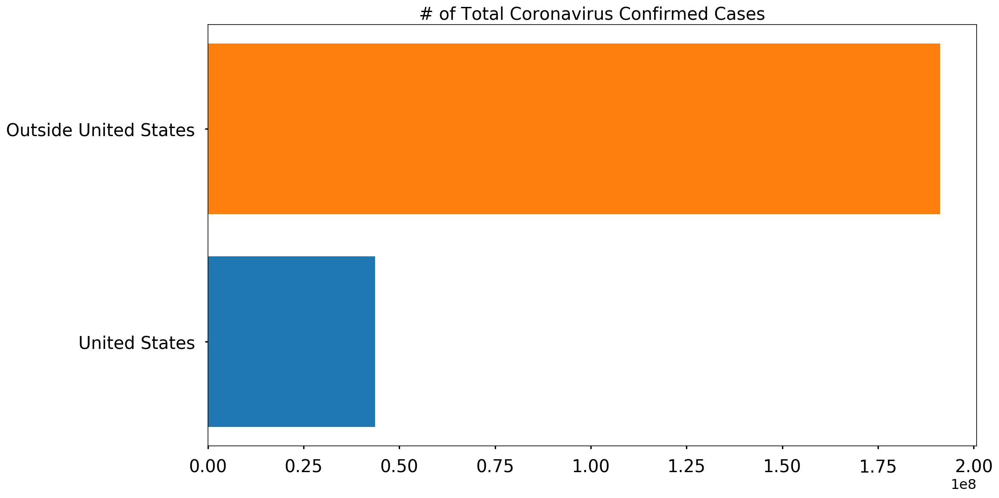

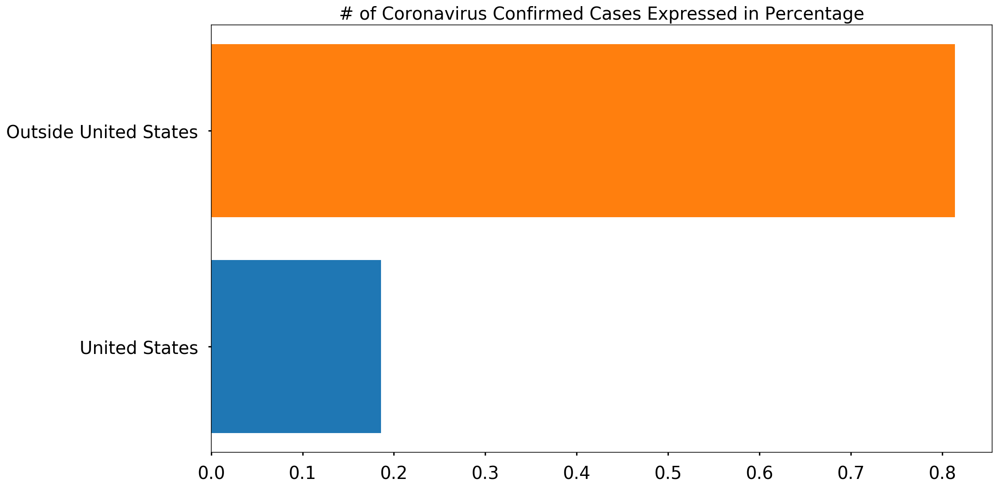

In [66]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [67]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 191237194 cases (81.4%):
United States 43683048 cases (18.6%)
Total: 234920242 cases


In [68]:
# Only show 10 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)

In [69]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

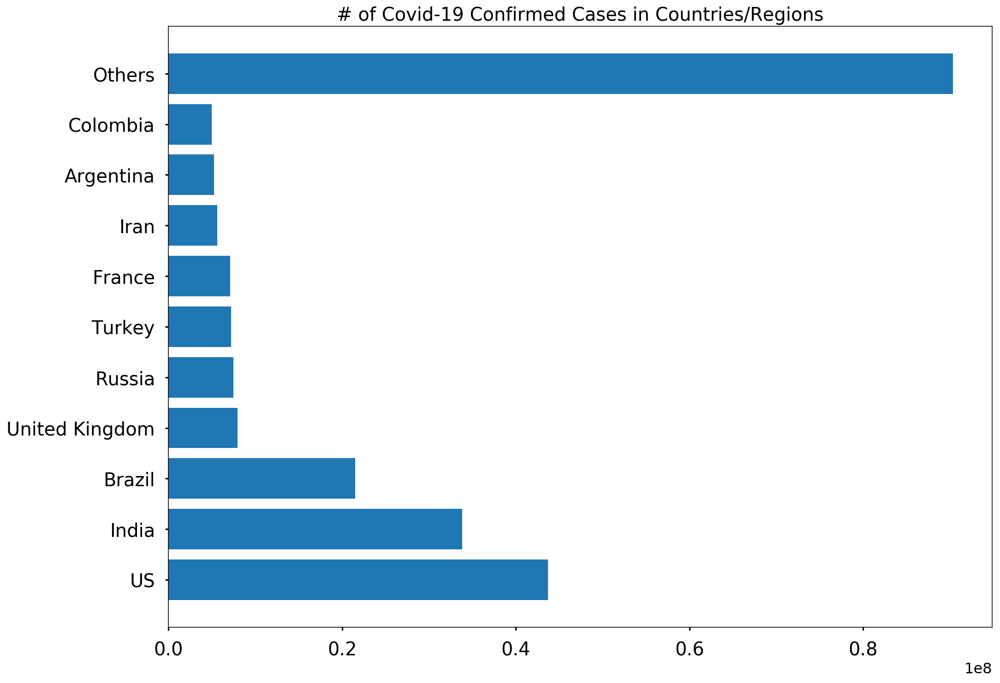

In [70]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

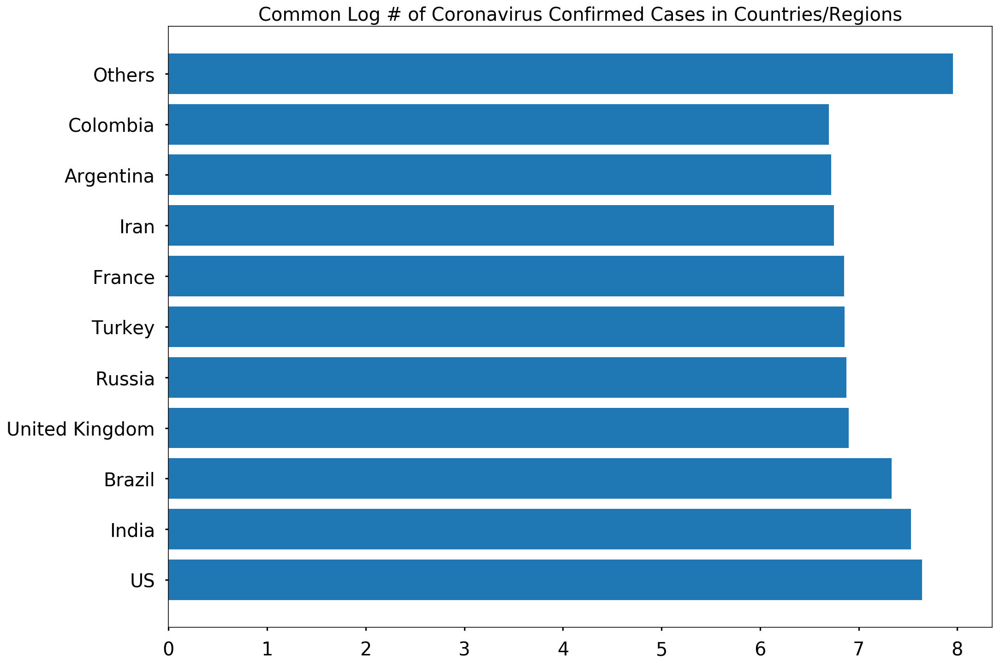

In [71]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [72]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

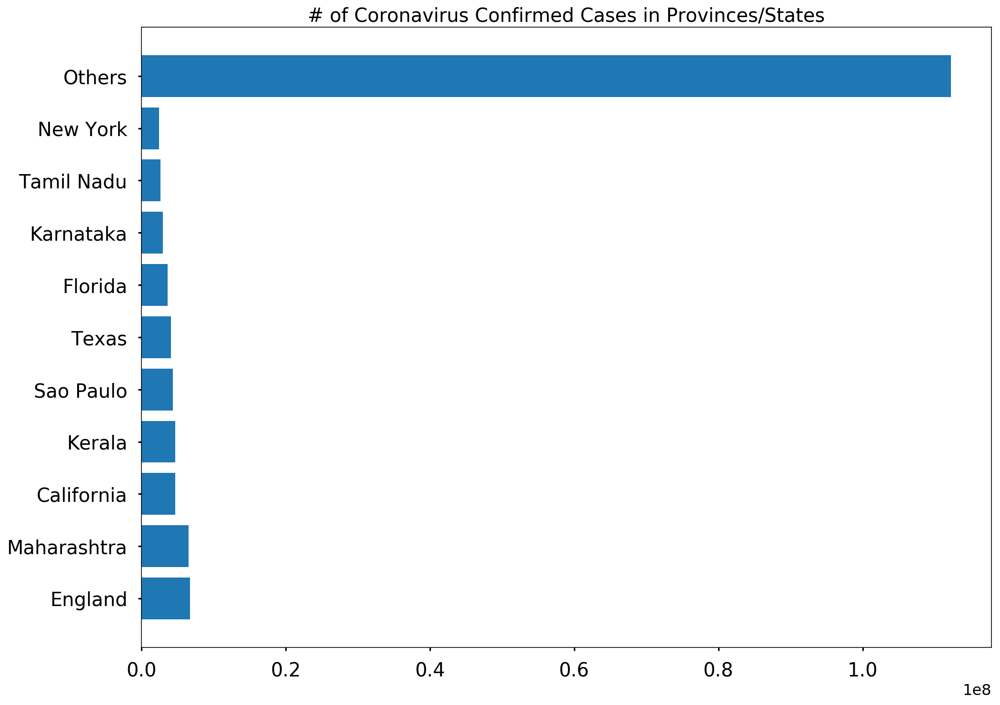

In [73]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

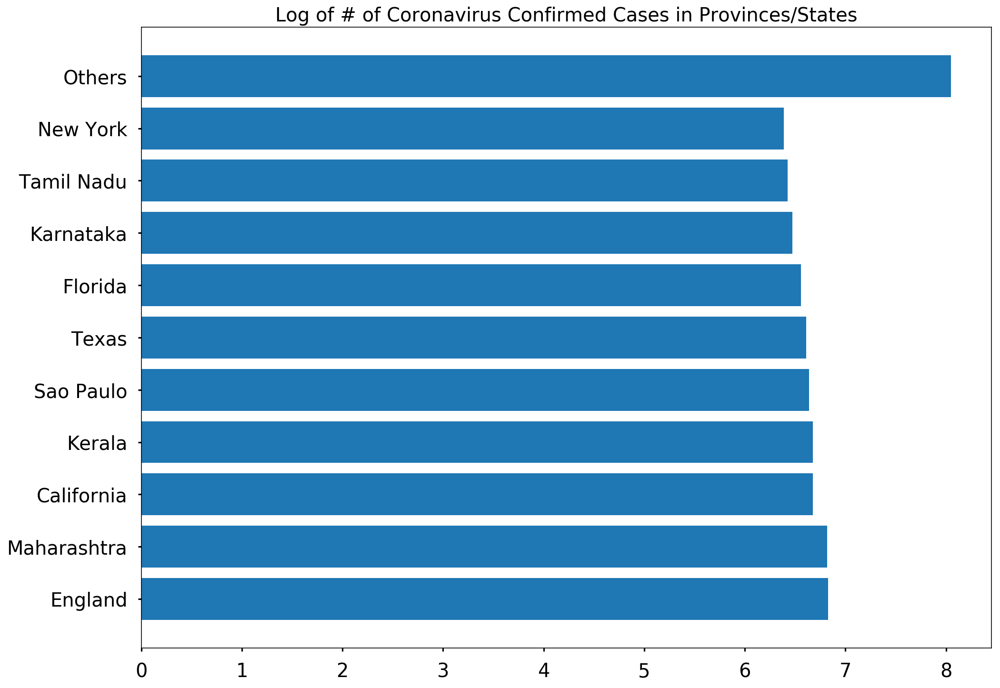

In [74]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

<a id='pie_charts'></a>
# Pie Chart Visualizations for COVID-19
Although pie charts are not necessarily the most informative visualizations, I added them to increase some variety for the visualizations. 

In [75]:
def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

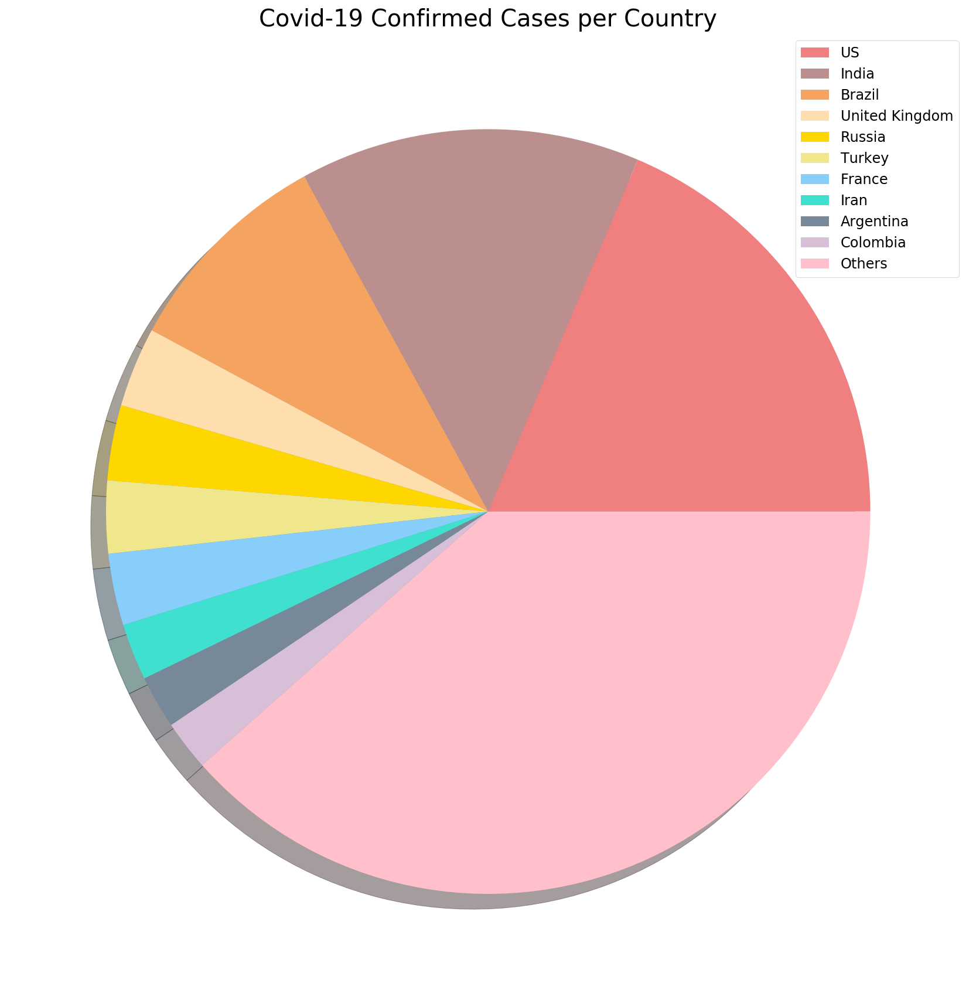

In [76]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

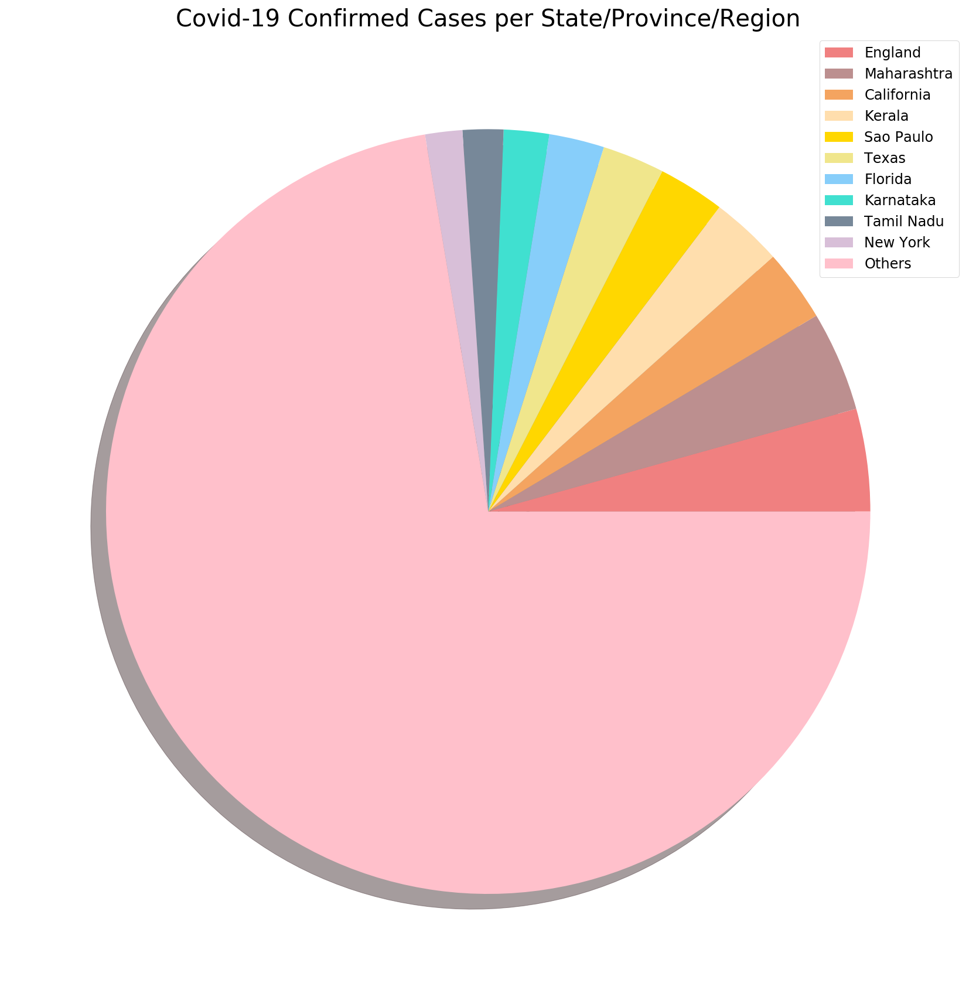

In [77]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [78]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

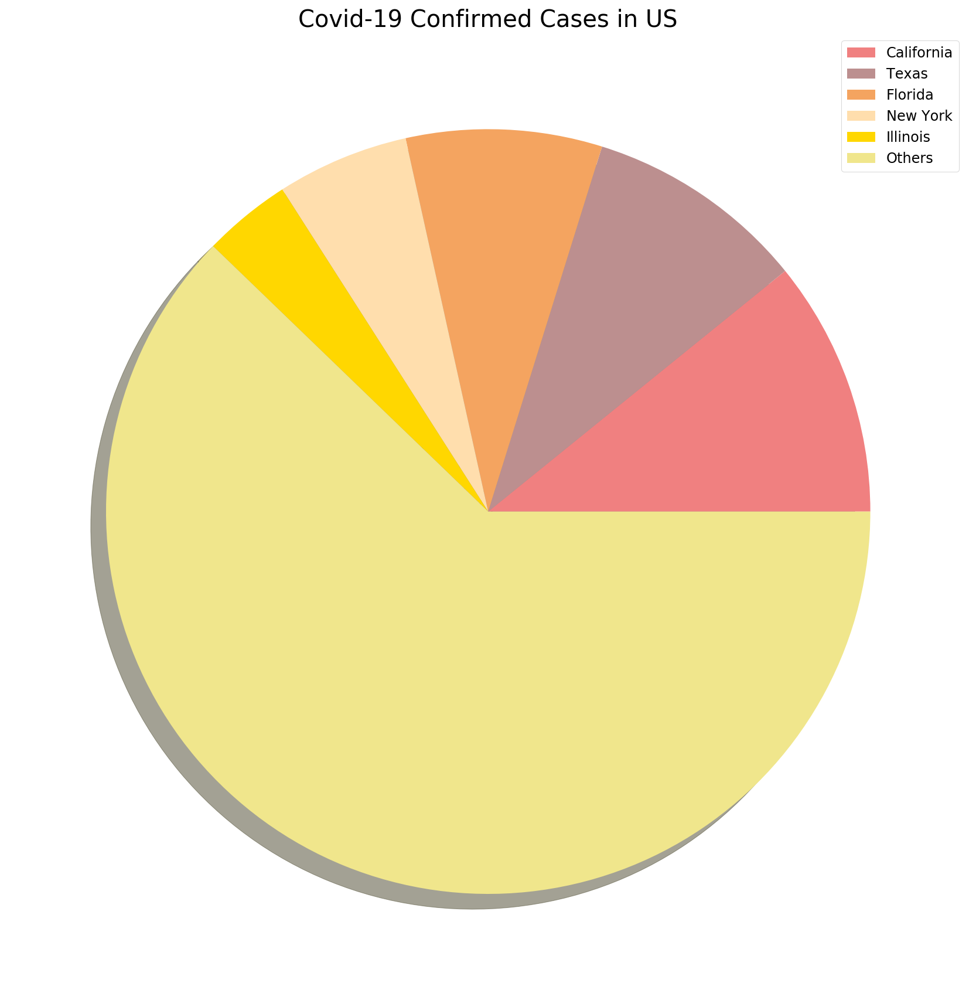

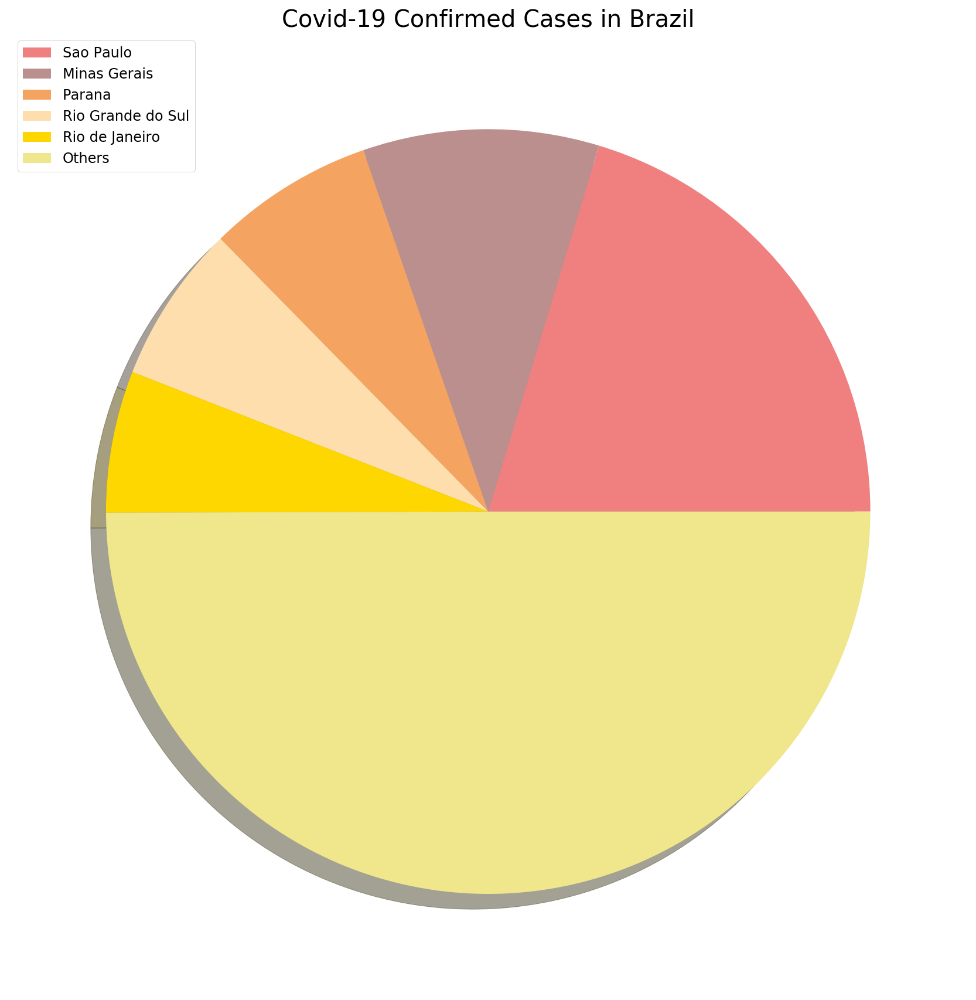

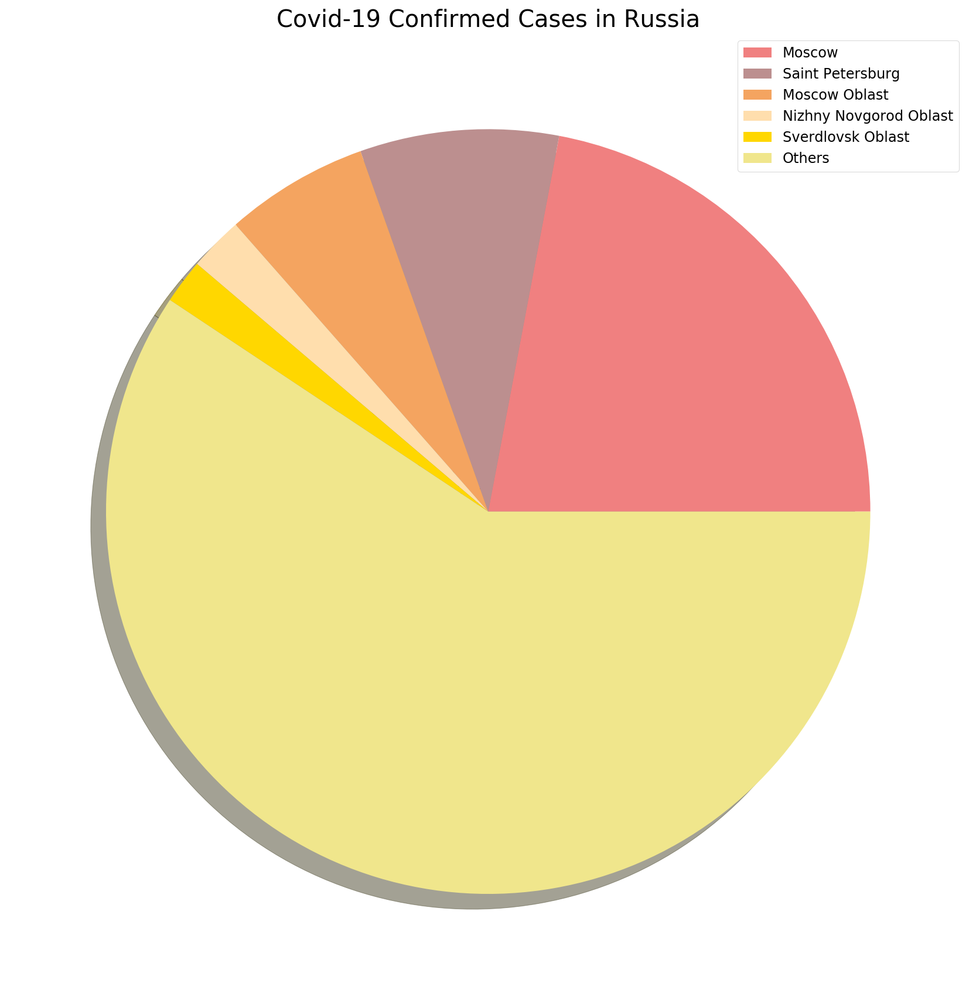

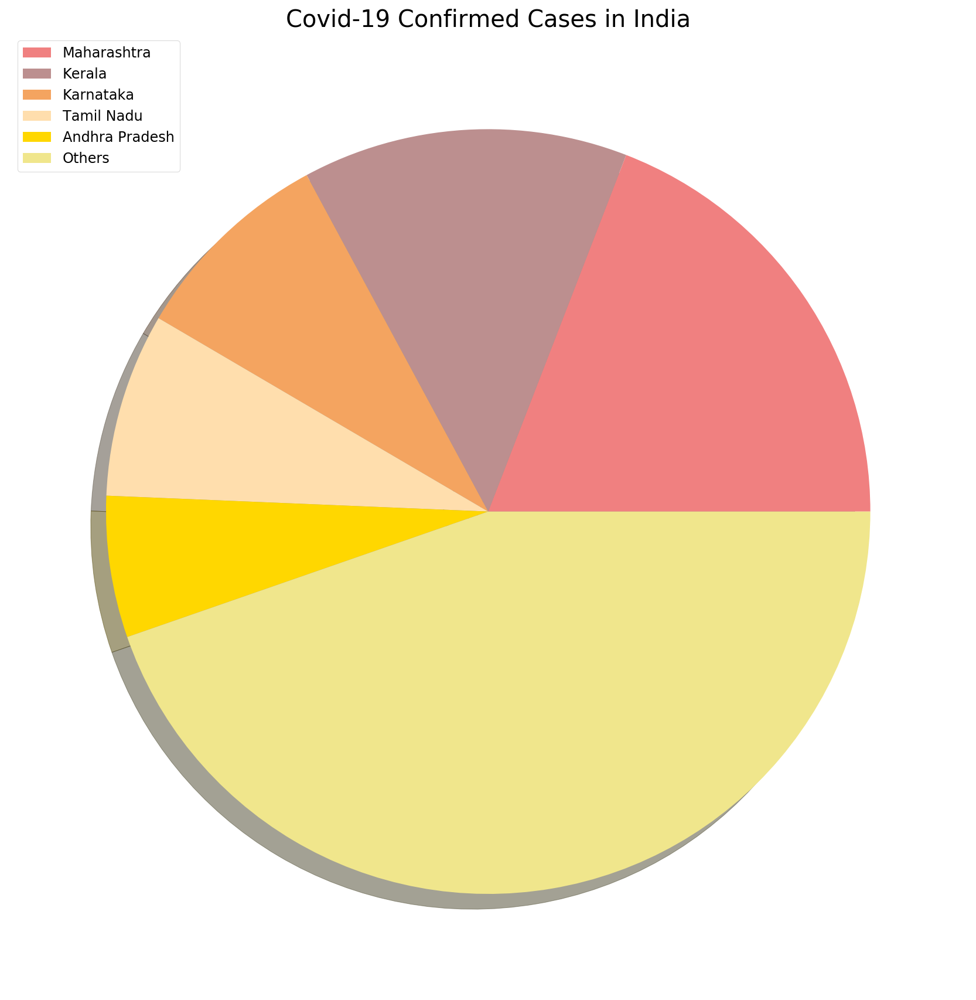

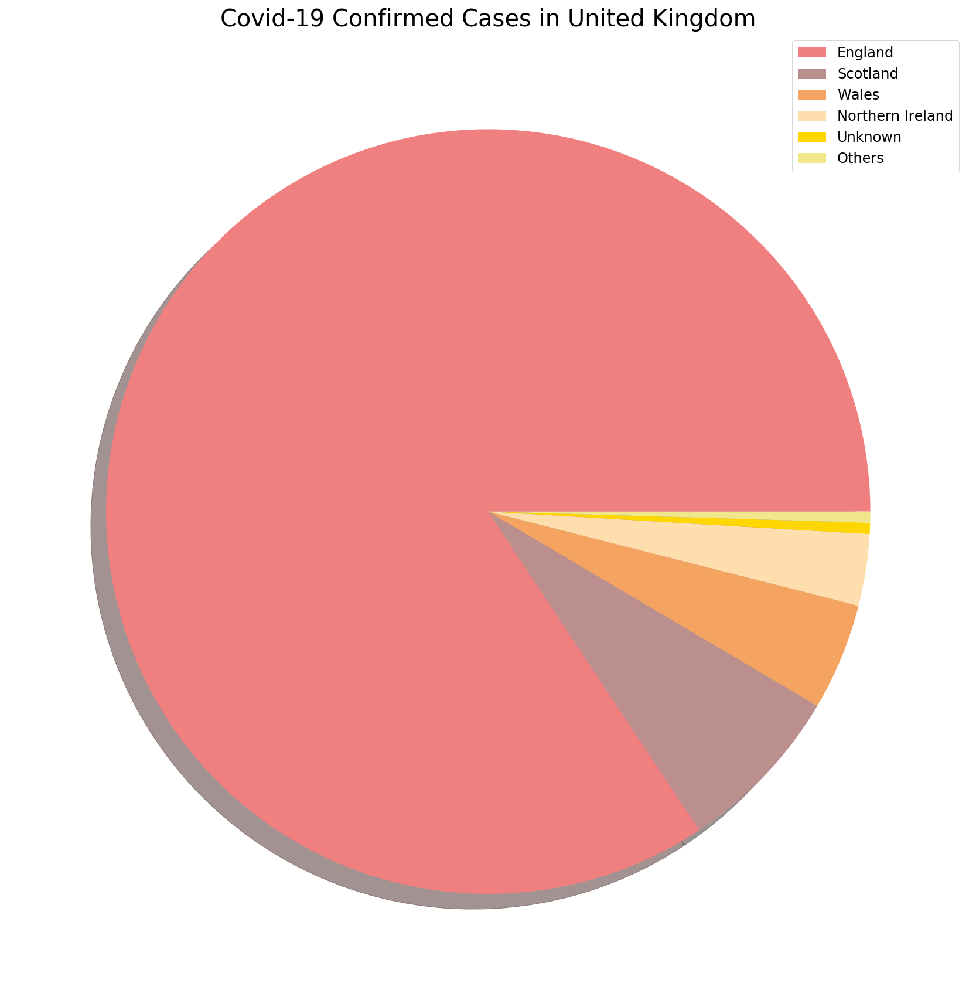

...

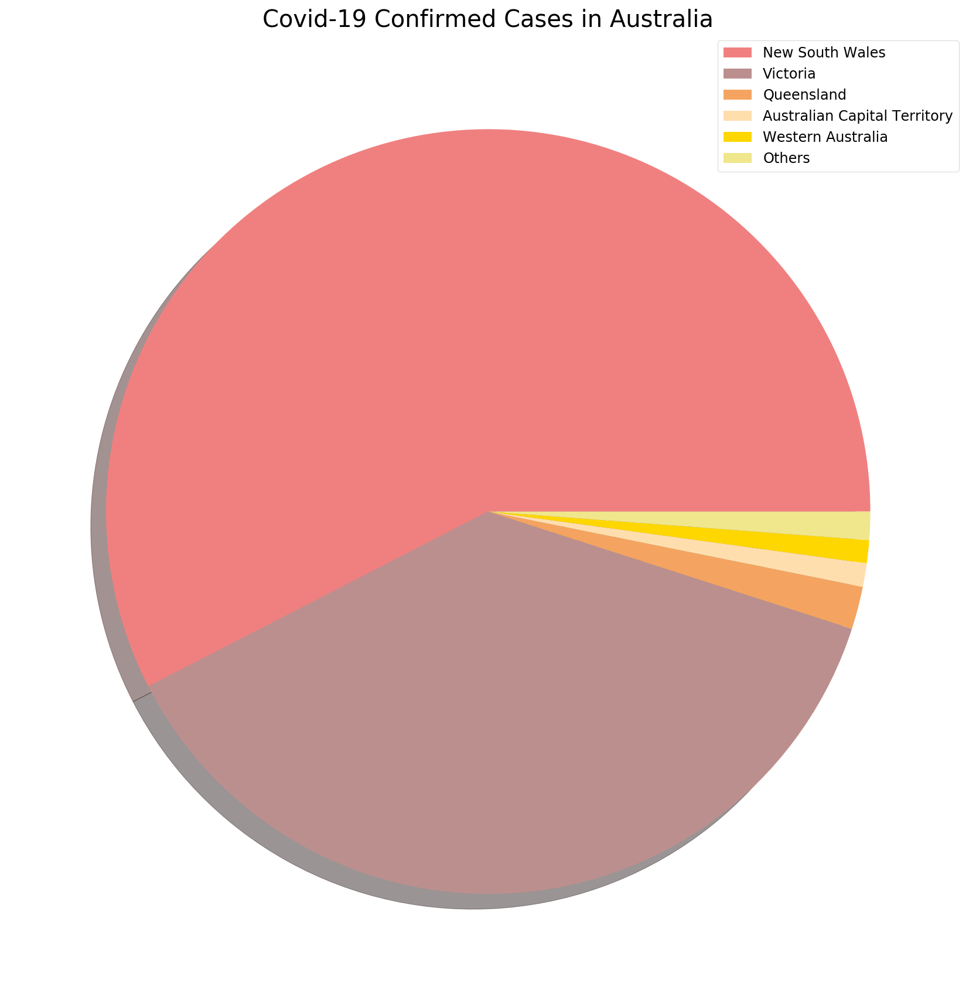

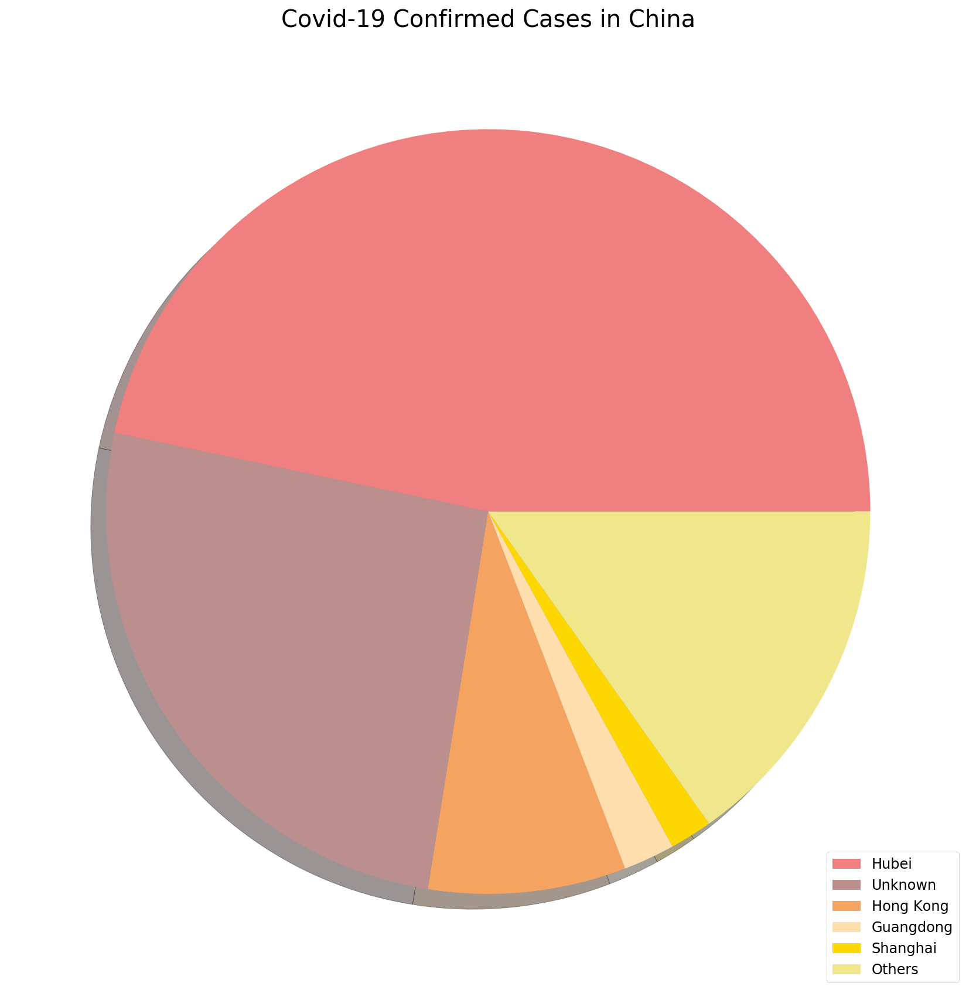

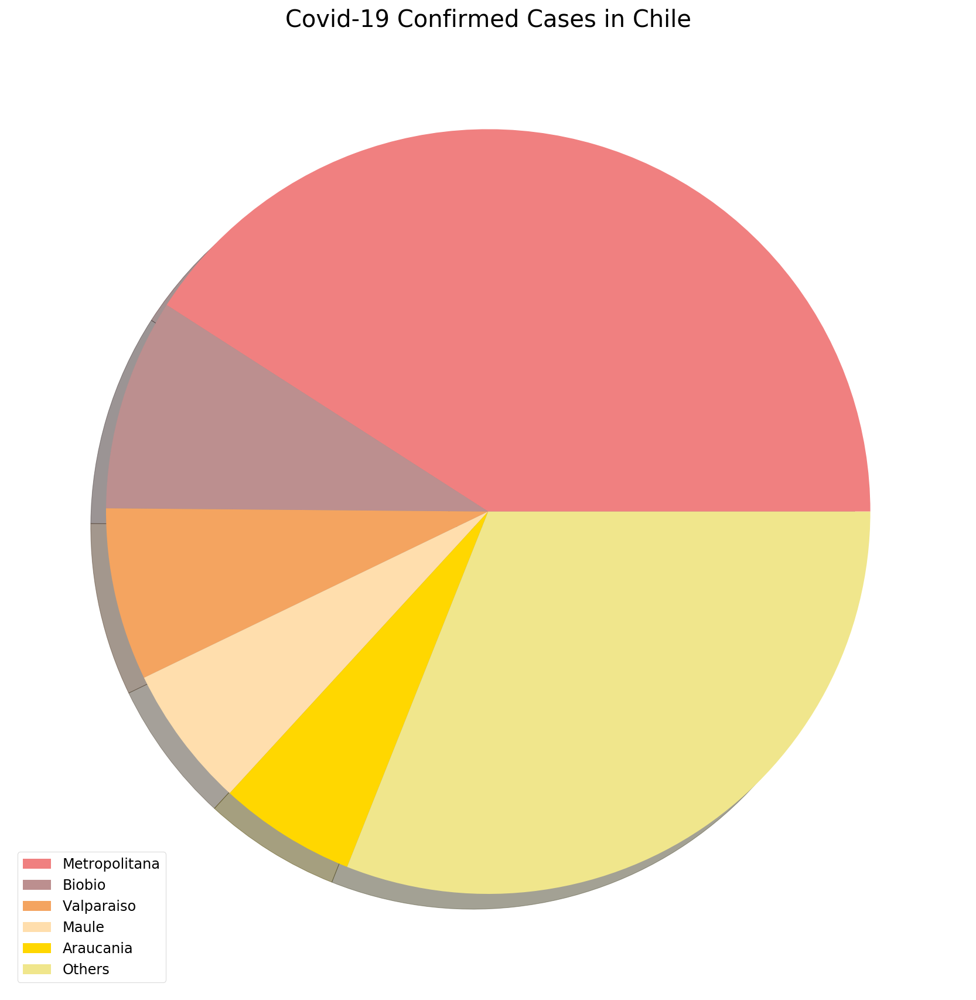

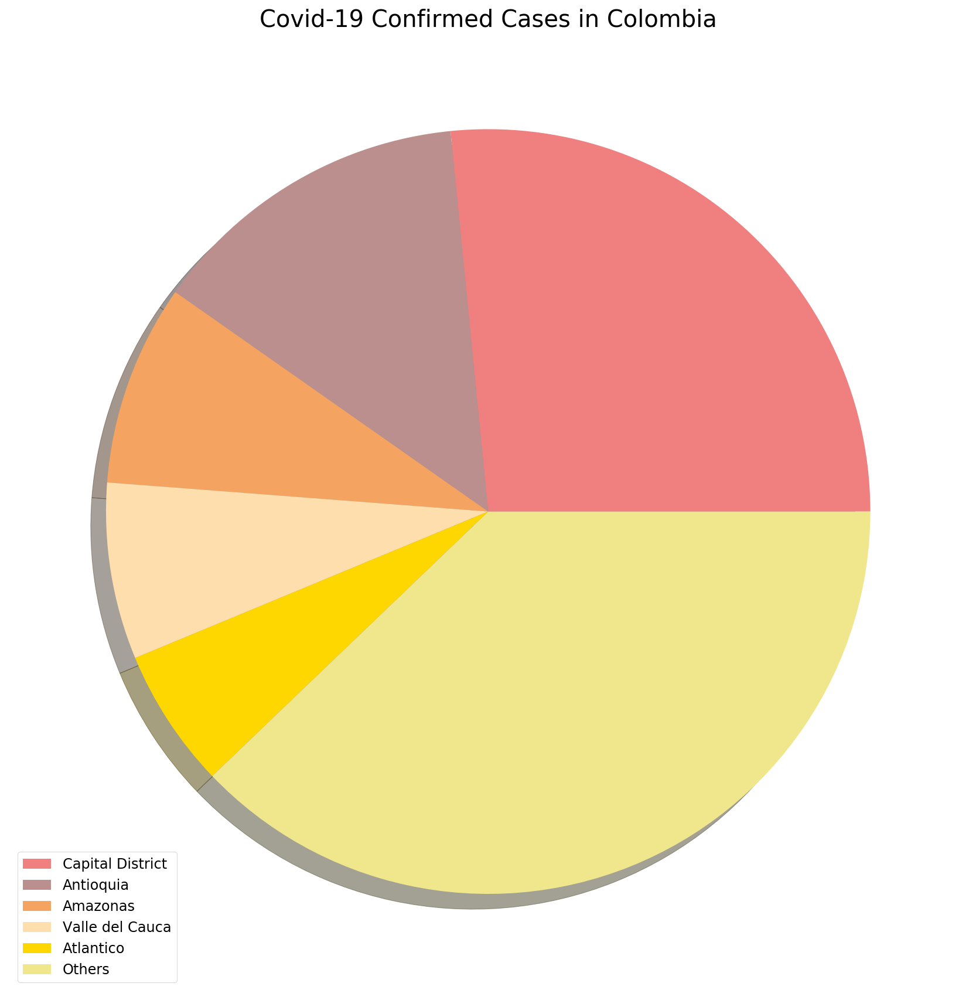

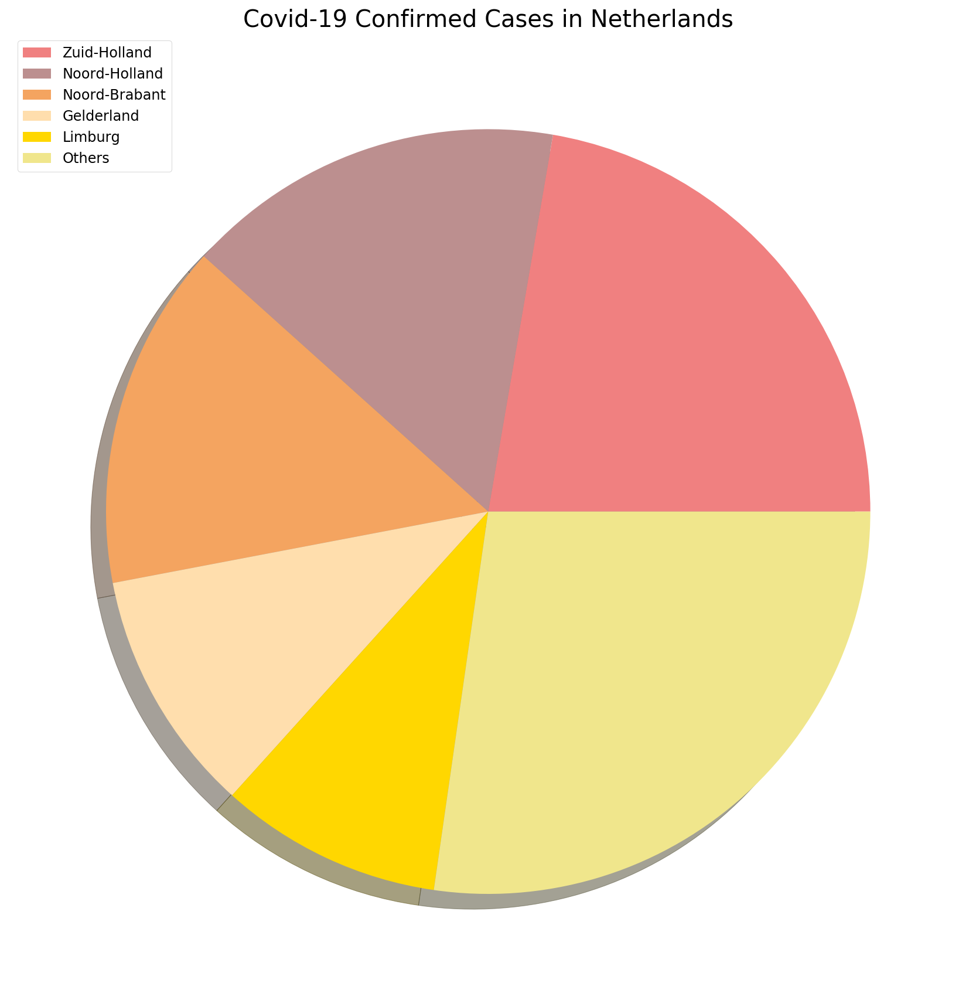

In [79]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'United Kingdom', 'Italy', 'Germany', 'France', 'Spain', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Chile', 'Colombia', 'Netherlands']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))

<a id='hospital_testing'></a>
# US Medical Data on Testing 
This gives us some information on US coronavirus testing, which is important for getting a clear picture of the pandemic.

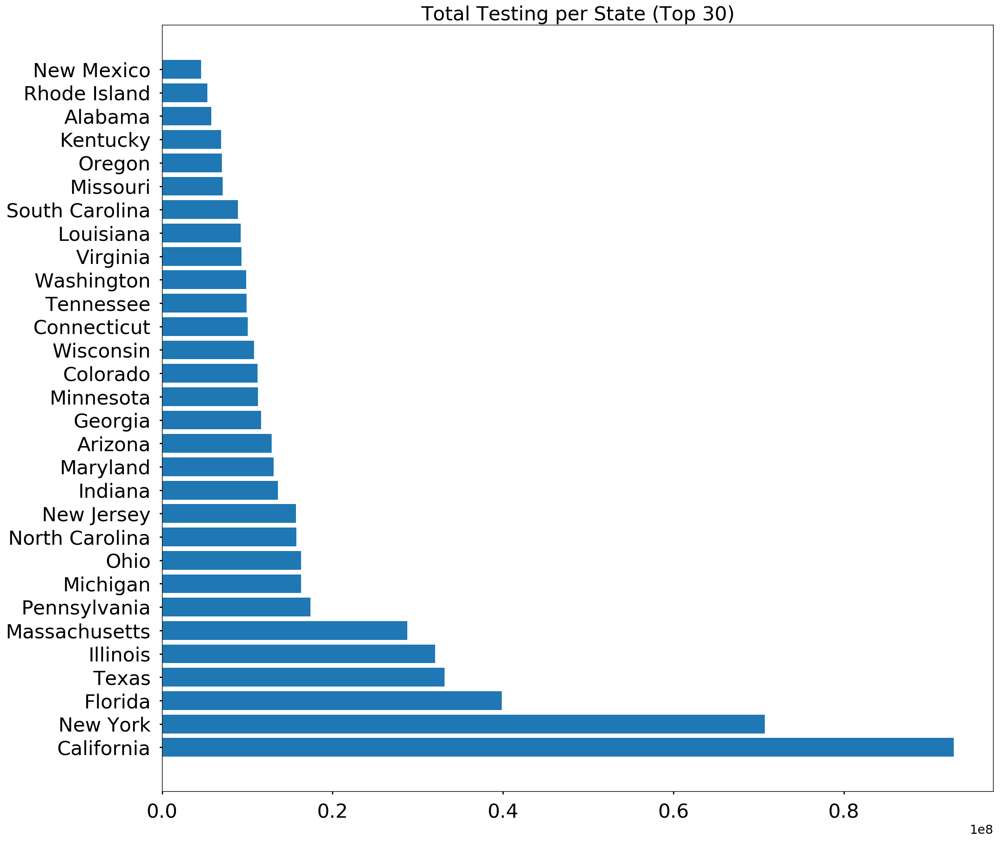

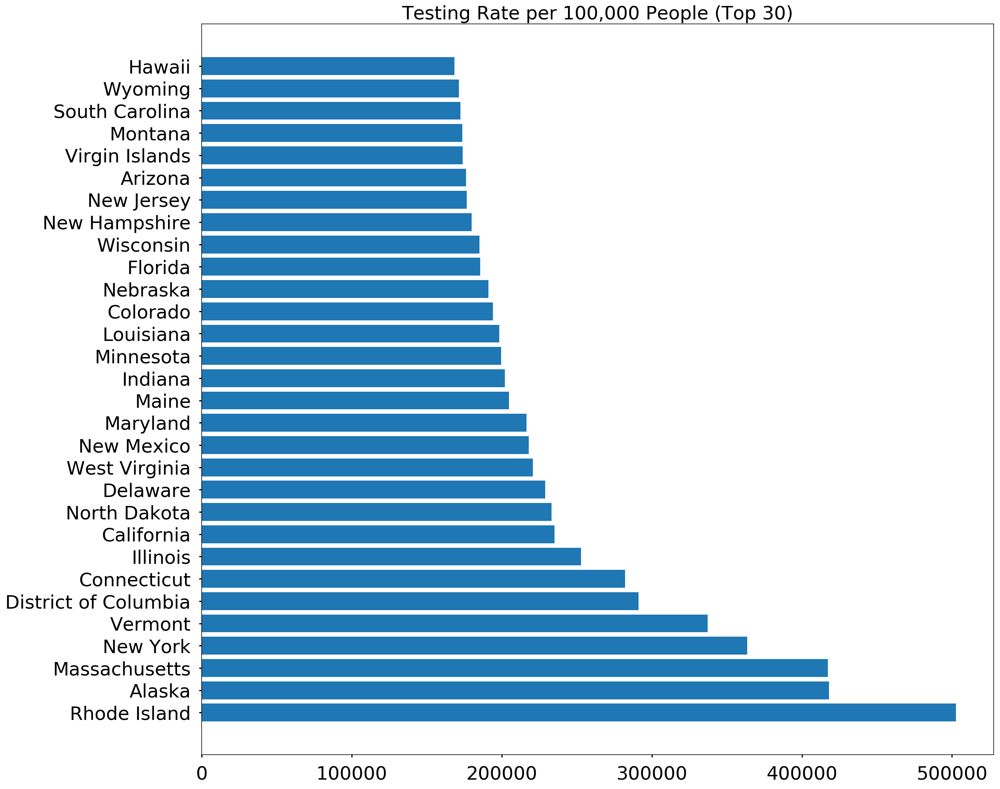

In [80]:
# Replace nan with 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')
 

plot_us_medical_data()